# Face Generation
In this project, you'll use generative adversarial networks to generate new images of faces.
### Get the Data
You'll be using two datasets in this project:
- MNIST
- CelebA

Since the celebA dataset is complex and you're doing GANs in a project for the first time, we want you to test your neural network on MNIST before CelebA.  Running the GANs on MNIST will allow you to see how well your model trains sooner.

If you're using [FloydHub](https://www.floydhub.com/), set `data_dir` to "/input" and use the [FloydHub data ID](http://docs.floydhub.com/home/using_datasets/) "R5KrjnANiKVhLWAkpXhNBe".

In [2]:
data_dir = './data'

# FloydHub - Use with data ID "R5KrjnANiKVhLWAkpXhNBe"
#data_dir = '/input'


"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
import helper

helper.download_extract('mnist', data_dir)
helper.download_extract('celeba', data_dir)

Found mnist Data
Found celeba Data


## Explore the Data
### MNIST
As you're aware, the [MNIST](http://yann.lecun.com/exdb/mnist/) dataset contains images of handwritten digits. You can view the first number of examples by changing `show_n_images`. 

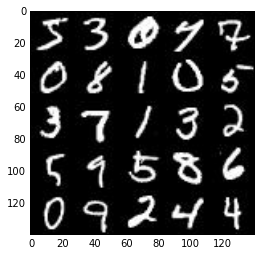

In [3]:
show_n_images = 25

"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
%matplotlib inline
import os
from glob import glob
from matplotlib import pyplot

mnist_images = helper.get_batch(glob(os.path.join(data_dir, 'mnist/*.jpg'))[:show_n_images], 28, 28, 'L')
pyplot.imshow(helper.images_square_grid(mnist_images, 'L'), cmap='gray')

### CelebA
The [CelebFaces Attributes Dataset (CelebA)](http://mmlab.ie.cuhk.edu.hk/projects/CelebA.html) dataset contains over 200,000 celebrity images with annotations.  Since you're going to be generating faces, you won't need the annotations.  You can view the first number of examples by changing `show_n_images`.

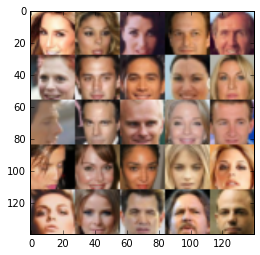

In [4]:
show_n_images = 25

"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
mnist_images = helper.get_batch(glob(os.path.join(data_dir, 'img_align_celeba/*.jpg'))[:show_n_images], 28, 28, 'RGB')
pyplot.imshow(helper.images_square_grid(mnist_images, 'RGB'))

## Preprocess the Data
Since the project's main focus is on building the GANs, we'll preprocess the data for you.  The values of the MNIST and CelebA dataset will be in the range of -0.5 to 0.5 of 28x28 dimensional images.  The CelebA images will be cropped to remove parts of the image that don't include a face, then resized down to 28x28.

The MNIST images are black and white images with a single [color channel](https://en.wikipedia.org/wiki/Channel_(digital_image%29) while the CelebA images have [3 color channels (RGB color channel)](https://en.wikipedia.org/wiki/Channel_(digital_image%29#RGB_Images).
## Build the Neural Network
You'll build the components necessary to build a GANs by implementing the following functions below:
- `model_inputs`
- `discriminator`
- `generator`
- `model_loss`
- `model_opt`
- `train`

### Check the Version of TensorFlow and Access to GPU
This will check to make sure you have the correct version of TensorFlow and access to a GPU

In [5]:
"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
from distutils.version import LooseVersion
import warnings
import tensorflow as tf

# Check TensorFlow Version
assert LooseVersion(tf.__version__) >= LooseVersion('1.0'), 'Please use TensorFlow version 1.0 or newer.  You are using {}'.format(tf.__version__)
print('TensorFlow Version: {}'.format(tf.__version__))

# Check for a GPU
if not tf.test.gpu_device_name():
    warnings.warn('No GPU found. Please use a GPU to train your neural network.')
else:
    print('Default GPU Device: {}'.format(tf.test.gpu_device_name()))

TensorFlow Version: 1.5.0
Default GPU Device: /device:GPU:0


### Input
Implement the `model_inputs` function to create TF Placeholders for the Neural Network. It should create the following placeholders:
- Real input images placeholder with rank 4 using `image_width`, `image_height`, and `image_channels`.
- Z input placeholder with rank 2 using `z_dim`.
- Learning rate placeholder with rank 0.

Return the placeholders in the following the tuple (tensor of real input images, tensor of z data)

In [8]:
import problem_unittests as tests

def model_inputs(image_width, image_height, image_channels, z_dim):
    """
    Create the model inputs
    :param image_width: The input image width
    :param image_height: The input image height
    :param image_channels: The number of image channels
    :param z_dim: The dimension of Z
    :return: Tuple of (tensor of real input images, tensor of z data, learning rate)
    """
    # TODO: Implement Function
    real_input = tf.placeholder(tf.float32, (None, image_width,image_height, image_channels), name='input_real')
    z_input = tf.placeholder(tf.float32, (None, z_dim), name='input_z')
    learning_rate = tf.placeholder(tf.float32)
    return real_input, z_input, learning_rate


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_inputs(model_inputs)

Tests Passed


### Discriminator
Implement `discriminator` to create a discriminator neural network that discriminates on `images`.  This function should be able to reuse the variables in the neural network.  Use [`tf.variable_scope`](https://www.tensorflow.org/api_docs/python/tf/variable_scope) with a scope name of "discriminator" to allow the variables to be reused.  The function should return a tuple of (tensor output of the discriminator, tensor logits of the discriminator).

In [10]:
def discriminator(images, reuse=False):
    """
    Create the discriminator network
    :param images: Tensor of input image(s)
    :param reuse: Boolean if the weights should be reused
    :return: Tuple of (tensor output of the discriminator, tensor logits of the discriminator)
    """
    # TODO: Implement Function
    alpha = 0.2
    with tf.variable_scope('discriminator', reuse=reuse):
        # Input layer is 28x28x3
        x1 = tf.layers.conv2d(images, 64, 5, strides=2, padding='same')
        relu1 = tf.maximum(alpha * x1, x1)
        # 14x14x64
        
        x2 = tf.layers.conv2d(relu1, 128, 5, strides=2, padding='same')
        bn2 = tf.layers.batch_normalization(x2, training=True)
        relu2 = tf.maximum(alpha * bn2, bn2)
        # 7x7x128
        
        x3 = tf.layers.conv2d(relu2, 256, 5, strides=2, padding='same')
        bn3 = tf.layers.batch_normalization(x3, training=True)
        relu3 = tf.maximum(alpha * bn3, bn3)
        # 4x4x256

        # Flatten it
        flat = tf.reshape(relu3, (-1, 4*4*256))
        logits = tf.layers.dense(flat, 1)
        out = tf.sigmoid(logits)
        
        return out, logits


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_discriminator(discriminator, tf)

Tests Passed


### Generator
Implement `generator` to generate an image using `z`. This function should be able to reuse the variables in the neural network.  Use [`tf.variable_scope`](https://www.tensorflow.org/api_docs/python/tf/variable_scope) with a scope name of "generator" to allow the variables to be reused. The function should return the generated 28 x 28 x `out_channel_dim` images.

In [42]:
def generator(z, out_channel_dim, is_train=True):
    """
    Create the generator network
    :param z: Input z
    :param out_channel_dim: The number of channels in the output image
    :param is_train: Boolean if generator is being used for training
    :return: The tensor output of the generator
    """
    # TODO: Implement Function
    alpha = 0.2
    with tf.variable_scope('generator', reuse=not is_train):
        # First fully connected layer
        x1 = tf.layers.dense(z, 2*2*512)
        # Reshape it to start the convolutional stack
        x1 = tf.reshape(x1, (-1, 2, 2, 512))
        x1 = tf.layers.batch_normalization(x1, training=is_train)
        x1 = tf.maximum(alpha * x1, x1)
        # 2x2X512 now
        
        x2 = tf.layers.conv2d_transpose(x1, 256, 5, strides=2, padding='valid', activation=None)
        x2 = tf.layers.batch_normalization(x2, training=is_train)
        x2 = tf.maximum(alpha * x2, x2)
        # 7x7x256 now
        
        x3 = tf.layers.conv2d_transpose(x2, 128, 5, strides=2, padding='same', activation=None)
        x3 = tf.layers.batch_normalization(x3, training=is_train)
        x3 = tf.maximum(alpha * x3, x3)
        # 14X28X128 now
        
        # Output layer
        logits = tf.layers.conv2d_transpose(x3, out_channel_dim, 3, strides=2, padding='same', activation=None)
        # 28x28x3 now
        
        out = tf.tanh(logits)
    return out        


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_generator(generator, tf)

Tests Passed


### Loss
Implement `model_loss` to build the GANs for training and calculate the loss.  The function should return a tuple of (discriminator loss, generator loss).  Use the following functions you implemented:
- `discriminator(images, reuse=False)`
- `generator(z, out_channel_dim, is_train=True)`

In [43]:
def model_loss(input_real, input_z, out_channel_dim):
    """
    Get the loss for the discriminator and generator
    :param input_real: Images from the real dataset
    :param input_z: Z input
    :param out_channel_dim: The number of channels in the output image
    :return: A tuple of (discriminator loss, generator loss)
    """
    # TODO: Implement Function
    
    g_model = generator(input_z, out_channel_dim)
    d_model_real, d_logits_real = discriminator(input_real)
    d_model_fake, d_logits_fake = discriminator(g_model, reuse=True)

    d_loss_real = tf.reduce_mean(tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_real, labels=tf.ones_like(d_model_real)))
    d_loss_fake = tf.reduce_mean(tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fake, labels=tf.zeros_like(d_model_fake)))
    g_loss = tf.reduce_mean(tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fake, labels=tf.ones_like(d_model_fake)))

    d_loss = d_loss_real + d_loss_fake

    return d_loss, g_loss


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_loss(model_loss)

Tests Passed


### Optimization
Implement `model_opt` to create the optimization operations for the GANs. Use [`tf.trainable_variables`](https://www.tensorflow.org/api_docs/python/tf/trainable_variables) to get all the trainable variables.  Filter the variables with names that are in the discriminator and generator scope names.  The function should return a tuple of (discriminator training operation, generator training operation).

In [44]:
def model_opt(d_loss, g_loss, learning_rate, beta1):
    """
    Get optimization operations
    :param d_loss: Discriminator loss Tensor
    :param g_loss: Generator loss Tensor
    :param learning_rate: Learning Rate Placeholder
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :return: A tuple of (discriminator training operation, generator training operation)
    """
    # TODO: Implement Function
    
    t_vars = tf.trainable_variables()
    d_vars = [var for var in t_vars if var.name.startswith('discriminator')]
    g_vars = [var for var in t_vars if var.name.startswith('generator')]

    # Optimize
    with tf.control_dependencies(tf.get_collection(tf.GraphKeys.UPDATE_OPS)):
        d_train_opt = tf.train.AdamOptimizer(learning_rate, beta1=beta1).minimize(d_loss, var_list=d_vars)
        g_train_opt = tf.train.AdamOptimizer(learning_rate, beta1=beta1).minimize(g_loss, var_list=g_vars)

    return d_train_opt, g_train_opt


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_opt(model_opt, tf)

Tests Passed


## Neural Network Training
### Show Output
Use this function to show the current output of the generator during training. It will help you determine how well the GANs is training.

In [45]:
"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
import numpy as np

def show_generator_output(sess, n_images, input_z, out_channel_dim, image_mode):
    """
    Show example output for the generator
    :param sess: TensorFlow session
    :param n_images: Number of Images to display
    :param input_z: Input Z Tensor
    :param out_channel_dim: The number of channels in the output image
    :param image_mode: The mode to use for images ("RGB" or "L")
    """
    cmap = None if image_mode == 'RGB' else 'gray'
    z_dim = input_z.get_shape().as_list()[-1]
    example_z = np.random.uniform(-1, 1, size=[n_images, z_dim])

    samples = sess.run(
        generator(input_z, out_channel_dim, False),
        feed_dict={input_z: example_z})

    images_grid = helper.images_square_grid(samples, image_mode)
    pyplot.imshow(images_grid, cmap=cmap)
    pyplot.show()

### Train
Implement `train` to build and train the GANs.  Use the following functions you implemented:
- `model_inputs(image_width, image_height, image_channels, z_dim)`
- `model_loss(input_real, input_z, out_channel_dim)`
- `model_opt(d_loss, g_loss, learning_rate, beta1)`

Use the `show_generator_output` to show `generator` output while you train. Running `show_generator_output` for every batch will drastically increase training time and increase the size of the notebook.  It's recommended to print the `generator` output every 100 batches.

In [61]:
def train(epoch_count, batch_size, z_dim, learning_rate, beta1, get_batches, data_shape, data_image_mode):
    """
    Train the GAN
    :param epoch_count: Number of epochs
    :param batch_size: Batch Size
    :param z_dim: Z dimension
    :param learning_rate: Learning Rate
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :param get_batches: Function to get batches
    :param data_shape: Shape of the data
    :param data_image_mode: The image mode to use for images ("RGB" or "L")
    """
    # TODO: Build Model
    
    _, image_width, image_height, image_channels = data_shape
    
    real_input, z_input, lr = model_inputs(image_width, image_height, image_channels, z_dim)
        
    d_loss, g_loss = model_loss(real_input, z_input, image_channels)                                                      
    
    d_opt, g_opt = model_opt(d_loss, g_loss, learning_rate, beta1)

    losses = []
    steps = 0
    print_every=10
    show_every=100
    n_images = 25
    
    with tf.Session() as sess:
        sess.run(tf.global_variables_initializer())
        for epoch_i in range(epoch_count):
            for batch_images  in get_batches(batch_size):
                # TODO: Train Model
                steps += 1
                batch_images *= 2
                # Sample random noise for G
                batch_z = np.random.uniform(-1, 1, size=(batch_size, z_dim))

                # Run optimizers
                _ = sess.run(d_opt, feed_dict={
                        real_input: batch_images, z_input: batch_z, lr: learning_rate})
                _ = sess.run(g_opt, feed_dict={
                        real_input: batch_images, z_input: batch_z, lr: learning_rate})

                if steps % print_every == 0:
                    # At the end of each epoch, get the losses and print them out
                    train_loss_d = d_loss.eval({z_input: batch_z, real_input: batch_images})
                    train_loss_g = g_loss.eval({z_input: batch_z})

                    print("Epoch {}/{}...".format(epoch_i+1, epochs),
                          "Discriminator Loss: {:.4f}...".format(train_loss_d),
                          "Generator Loss: {:.4f}".format(train_loss_g))
                    # Save losses to view after training
                    losses.append((train_loss_d, train_loss_g))

                if steps % show_every == 0:
                    show_generator_output(sess, n_images, z_input, image_channels, data_image_mode)
        


### MNIST
Test your GANs architecture on MNIST.  After 2 epochs, the GANs should be able to generate images that look like handwritten digits.  Make sure the loss of the generator is lower than the loss of the discriminator or close to 0.

Epoch 1/10... Discriminator Loss: 5.5939... Generator Loss: 0.0390
Epoch 1/10... Discriminator Loss: 0.5298... Generator Loss: 3.5338
Epoch 1/10... Discriminator Loss: 4.5458... Generator Loss: 8.7843
Epoch 1/10... Discriminator Loss: 1.5820... Generator Loss: 0.5402
Epoch 1/10... Discriminator Loss: 1.3942... Generator Loss: 1.6739
Epoch 1/10... Discriminator Loss: 1.3440... Generator Loss: 3.0785
Epoch 1/10... Discriminator Loss: 0.1918... Generator Loss: 2.4333
Epoch 1/10... Discriminator Loss: 0.7320... Generator Loss: 1.1173
Epoch 1/10... Discriminator Loss: 2.3436... Generator Loss: 8.1241
Epoch 1/10... Discriminator Loss: 1.9112... Generator Loss: 0.2960


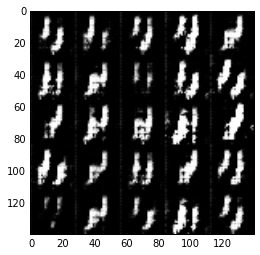

Epoch 1/10... Discriminator Loss: 1.7897... Generator Loss: 0.5771
Epoch 1/10... Discriminator Loss: 2.1250... Generator Loss: 0.5536
Epoch 1/10... Discriminator Loss: 1.4804... Generator Loss: 0.4411
Epoch 1/10... Discriminator Loss: 1.9550... Generator Loss: 0.4050
Epoch 1/10... Discriminator Loss: 1.1668... Generator Loss: 3.0665
Epoch 1/10... Discriminator Loss: 0.6835... Generator Loss: 2.7451
Epoch 1/10... Discriminator Loss: 0.5057... Generator Loss: 2.2845
Epoch 1/10... Discriminator Loss: 0.7448... Generator Loss: 1.4596
Epoch 1/10... Discriminator Loss: 0.9464... Generator Loss: 1.1072
Epoch 1/10... Discriminator Loss: 0.4966... Generator Loss: 1.4530


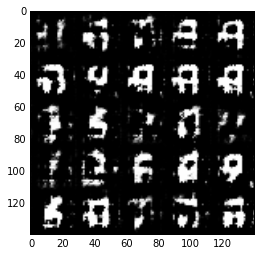

Epoch 1/10... Discriminator Loss: 0.8138... Generator Loss: 0.9669
Epoch 1/10... Discriminator Loss: 1.4057... Generator Loss: 0.7245
Epoch 1/10... Discriminator Loss: 0.7027... Generator Loss: 1.5643
Epoch 1/10... Discriminator Loss: 1.4212... Generator Loss: 2.0509
Epoch 1/10... Discriminator Loss: 1.0387... Generator Loss: 0.8877
Epoch 1/10... Discriminator Loss: 0.6944... Generator Loss: 2.1084
Epoch 1/10... Discriminator Loss: 0.7989... Generator Loss: 0.9553
Epoch 1/10... Discriminator Loss: 1.1423... Generator Loss: 1.0611
Epoch 1/10... Discriminator Loss: 0.9967... Generator Loss: 0.7261
Epoch 1/10... Discriminator Loss: 0.5873... Generator Loss: 1.6465


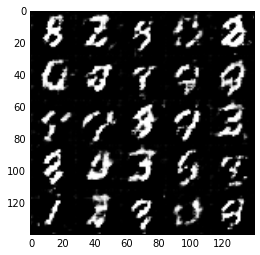

Epoch 1/10... Discriminator Loss: 0.6616... Generator Loss: 1.3856
Epoch 1/10... Discriminator Loss: 1.3615... Generator Loss: 0.5048
Epoch 1/10... Discriminator Loss: 0.9369... Generator Loss: 1.4489
Epoch 1/10... Discriminator Loss: 1.4144... Generator Loss: 0.7931
Epoch 1/10... Discriminator Loss: 1.1941... Generator Loss: 2.6382
Epoch 1/10... Discriminator Loss: 1.4554... Generator Loss: 3.0052
Epoch 1/10... Discriminator Loss: 1.0957... Generator Loss: 1.1215
Epoch 1/10... Discriminator Loss: 1.1368... Generator Loss: 1.6334
Epoch 1/10... Discriminator Loss: 0.9879... Generator Loss: 0.8119
Epoch 1/10... Discriminator Loss: 1.2026... Generator Loss: 2.0554


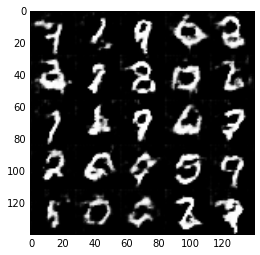

Epoch 1/10... Discriminator Loss: 1.1645... Generator Loss: 0.7093
Epoch 1/10... Discriminator Loss: 1.2628... Generator Loss: 0.7043
Epoch 1/10... Discriminator Loss: 1.1275... Generator Loss: 1.6015
Epoch 1/10... Discriminator Loss: 0.8128... Generator Loss: 0.9319
Epoch 1/10... Discriminator Loss: 0.9471... Generator Loss: 1.9281
Epoch 1/10... Discriminator Loss: 1.0639... Generator Loss: 0.9598
Epoch 2/10... Discriminator Loss: 1.3211... Generator Loss: 1.8857
Epoch 2/10... Discriminator Loss: 1.1545... Generator Loss: 1.9618
Epoch 2/10... Discriminator Loss: 1.0971... Generator Loss: 1.8363
Epoch 2/10... Discriminator Loss: 0.9988... Generator Loss: 1.4474


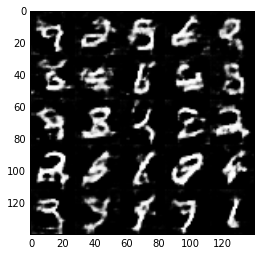

Epoch 2/10... Discriminator Loss: 1.0266... Generator Loss: 1.1475
Epoch 2/10... Discriminator Loss: 1.3053... Generator Loss: 0.5453
Epoch 2/10... Discriminator Loss: 1.1027... Generator Loss: 1.0584
Epoch 2/10... Discriminator Loss: 1.6179... Generator Loss: 0.3692
Epoch 2/10... Discriminator Loss: 1.2902... Generator Loss: 0.5376
Epoch 2/10... Discriminator Loss: 0.9545... Generator Loss: 1.0936
Epoch 2/10... Discriminator Loss: 0.8907... Generator Loss: 0.9955
Epoch 2/10... Discriminator Loss: 1.1446... Generator Loss: 1.0514
Epoch 2/10... Discriminator Loss: 1.0985... Generator Loss: 1.3149
Epoch 2/10... Discriminator Loss: 1.2926... Generator Loss: 0.5370


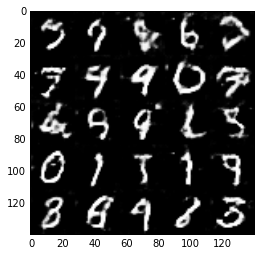

Epoch 2/10... Discriminator Loss: 0.9670... Generator Loss: 1.0019
Epoch 2/10... Discriminator Loss: 1.1088... Generator Loss: 0.9832
Epoch 2/10... Discriminator Loss: 1.0186... Generator Loss: 1.2926
Epoch 2/10... Discriminator Loss: 1.6007... Generator Loss: 0.3929
Epoch 2/10... Discriminator Loss: 2.2684... Generator Loss: 0.1681
Epoch 2/10... Discriminator Loss: 1.3438... Generator Loss: 0.4939
Epoch 2/10... Discriminator Loss: 0.9638... Generator Loss: 1.3305
Epoch 2/10... Discriminator Loss: 1.0954... Generator Loss: 1.0120
Epoch 2/10... Discriminator Loss: 1.1433... Generator Loss: 1.6425
Epoch 2/10... Discriminator Loss: 1.4097... Generator Loss: 0.4473


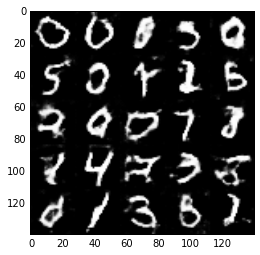

Epoch 2/10... Discriminator Loss: 1.3856... Generator Loss: 0.5716
Epoch 2/10... Discriminator Loss: 1.1002... Generator Loss: 1.4967
Epoch 2/10... Discriminator Loss: 1.0400... Generator Loss: 0.9725
Epoch 2/10... Discriminator Loss: 0.9934... Generator Loss: 1.7029
Epoch 2/10... Discriminator Loss: 1.0516... Generator Loss: 0.8677
Epoch 2/10... Discriminator Loss: 2.8984... Generator Loss: 4.1128
Epoch 2/10... Discriminator Loss: 1.2350... Generator Loss: 0.8448
Epoch 2/10... Discriminator Loss: 1.2984... Generator Loss: 0.6207
Epoch 2/10... Discriminator Loss: 1.3503... Generator Loss: 0.5087
Epoch 2/10... Discriminator Loss: 1.0950... Generator Loss: 1.3153


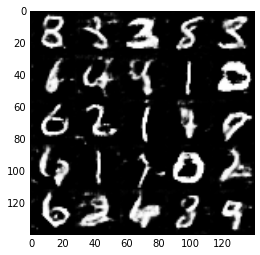

Epoch 2/10... Discriminator Loss: 1.1020... Generator Loss: 0.7281
Epoch 2/10... Discriminator Loss: 1.2093... Generator Loss: 1.2881
Epoch 2/10... Discriminator Loss: 0.9785... Generator Loss: 0.9259
Epoch 2/10... Discriminator Loss: 1.1039... Generator Loss: 1.0928
Epoch 2/10... Discriminator Loss: 1.0085... Generator Loss: 0.7600
Epoch 2/10... Discriminator Loss: 1.9052... Generator Loss: 0.2484
Epoch 2/10... Discriminator Loss: 1.2253... Generator Loss: 1.7768
Epoch 2/10... Discriminator Loss: 1.3825... Generator Loss: 2.0162
Epoch 2/10... Discriminator Loss: 1.7830... Generator Loss: 0.2803
Epoch 2/10... Discriminator Loss: 2.2551... Generator Loss: 3.2427


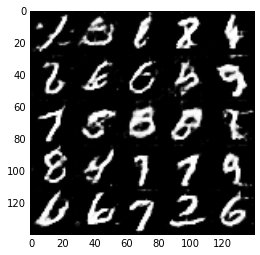

Epoch 2/10... Discriminator Loss: 1.2093... Generator Loss: 0.7374
Epoch 2/10... Discriminator Loss: 1.0808... Generator Loss: 0.9592
Epoch 2/10... Discriminator Loss: 1.1828... Generator Loss: 0.7200
Epoch 3/10... Discriminator Loss: 1.2739... Generator Loss: 1.2330
Epoch 3/10... Discriminator Loss: 1.6454... Generator Loss: 0.3215
Epoch 3/10... Discriminator Loss: 1.3957... Generator Loss: 0.4155
Epoch 3/10... Discriminator Loss: 1.0244... Generator Loss: 0.9246
Epoch 3/10... Discriminator Loss: 0.8980... Generator Loss: 1.1109
Epoch 3/10... Discriminator Loss: 1.2103... Generator Loss: 0.7176
Epoch 3/10... Discriminator Loss: 1.2526... Generator Loss: 0.5476


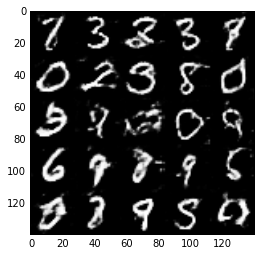

Epoch 3/10... Discriminator Loss: 1.1433... Generator Loss: 0.9065
Epoch 3/10... Discriminator Loss: 1.1749... Generator Loss: 0.8086
Epoch 3/10... Discriminator Loss: 1.0254... Generator Loss: 1.2227
Epoch 3/10... Discriminator Loss: 1.1779... Generator Loss: 1.2711
Epoch 3/10... Discriminator Loss: 1.0941... Generator Loss: 0.7794
Epoch 3/10... Discriminator Loss: 1.3530... Generator Loss: 0.5147
Epoch 3/10... Discriminator Loss: 1.5463... Generator Loss: 0.3449
Epoch 3/10... Discriminator Loss: 1.1196... Generator Loss: 0.6334
Epoch 3/10... Discriminator Loss: 1.1869... Generator Loss: 0.7558
Epoch 3/10... Discriminator Loss: 1.0529... Generator Loss: 0.7821


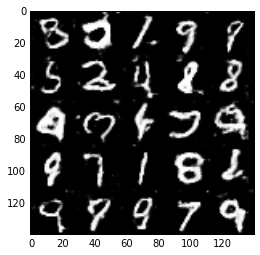

Epoch 3/10... Discriminator Loss: 0.7648... Generator Loss: 1.2589
Epoch 3/10... Discriminator Loss: 1.2811... Generator Loss: 0.6485
Epoch 3/10... Discriminator Loss: 1.2855... Generator Loss: 0.5673
Epoch 3/10... Discriminator Loss: 1.1831... Generator Loss: 2.5553
Epoch 3/10... Discriminator Loss: 1.3757... Generator Loss: 0.5891
Epoch 3/10... Discriminator Loss: 1.2878... Generator Loss: 0.5056
Epoch 3/10... Discriminator Loss: 1.2821... Generator Loss: 0.5872
Epoch 3/10... Discriminator Loss: 1.4152... Generator Loss: 0.4217
Epoch 3/10... Discriminator Loss: 1.4136... Generator Loss: 0.4400
Epoch 3/10... Discriminator Loss: 0.8877... Generator Loss: 1.2561


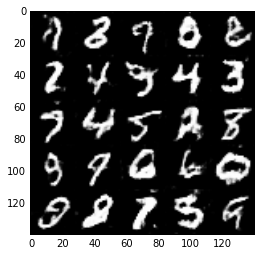

Epoch 3/10... Discriminator Loss: 0.9231... Generator Loss: 1.4828
Epoch 3/10... Discriminator Loss: 1.0249... Generator Loss: 1.5549
Epoch 3/10... Discriminator Loss: 0.7950... Generator Loss: 1.7472
Epoch 3/10... Discriminator Loss: 2.0036... Generator Loss: 0.2540
Epoch 3/10... Discriminator Loss: 1.0603... Generator Loss: 2.6189
Epoch 3/10... Discriminator Loss: 1.4032... Generator Loss: 0.4637
Epoch 3/10... Discriminator Loss: 1.0862... Generator Loss: 0.9942
Epoch 3/10... Discriminator Loss: 1.0281... Generator Loss: 1.4075
Epoch 3/10... Discriminator Loss: 1.4381... Generator Loss: 0.4888
Epoch 3/10... Discriminator Loss: 1.1556... Generator Loss: 0.7351


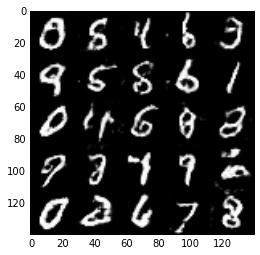

Epoch 3/10... Discriminator Loss: 0.9053... Generator Loss: 1.1608
Epoch 3/10... Discriminator Loss: 1.1691... Generator Loss: 0.6511
Epoch 3/10... Discriminator Loss: 1.9683... Generator Loss: 0.2530
Epoch 3/10... Discriminator Loss: 0.7198... Generator Loss: 1.8605
Epoch 3/10... Discriminator Loss: 1.0683... Generator Loss: 1.8305
Epoch 3/10... Discriminator Loss: 0.9505... Generator Loss: 1.3857
Epoch 3/10... Discriminator Loss: 0.9118... Generator Loss: 1.6958
Epoch 3/10... Discriminator Loss: 1.1427... Generator Loss: 0.9054
Epoch 3/10... Discriminator Loss: 1.1285... Generator Loss: 0.7708
Epoch 3/10... Discriminator Loss: 1.2151... Generator Loss: 0.7329


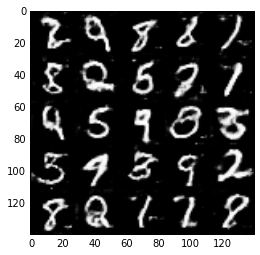

Epoch 4/10... Discriminator Loss: 1.4934... Generator Loss: 2.3289
Epoch 4/10... Discriminator Loss: 1.2790... Generator Loss: 1.6616
Epoch 4/10... Discriminator Loss: 1.3974... Generator Loss: 0.4349
Epoch 4/10... Discriminator Loss: 1.1416... Generator Loss: 0.9887
Epoch 4/10... Discriminator Loss: 1.0662... Generator Loss: 1.2177
Epoch 4/10... Discriminator Loss: 1.3278... Generator Loss: 0.5205
Epoch 4/10... Discriminator Loss: 1.3849... Generator Loss: 0.5103
Epoch 4/10... Discriminator Loss: 1.4592... Generator Loss: 2.7610
Epoch 4/10... Discriminator Loss: 1.3983... Generator Loss: 0.4504
Epoch 4/10... Discriminator Loss: 1.5689... Generator Loss: 2.4450


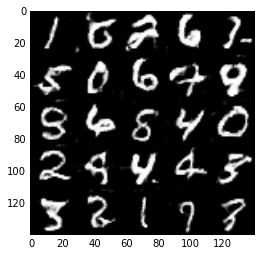

Epoch 4/10... Discriminator Loss: 0.7671... Generator Loss: 1.6633
Epoch 4/10... Discriminator Loss: 1.1615... Generator Loss: 0.6126
Epoch 4/10... Discriminator Loss: 0.7891... Generator Loss: 1.1320
Epoch 4/10... Discriminator Loss: 1.1818... Generator Loss: 0.7027
Epoch 4/10... Discriminator Loss: 2.2001... Generator Loss: 0.1834
Epoch 4/10... Discriminator Loss: 1.0357... Generator Loss: 1.0956
Epoch 4/10... Discriminator Loss: 1.1964... Generator Loss: 0.9580
Epoch 4/10... Discriminator Loss: 1.2628... Generator Loss: 0.8555
Epoch 4/10... Discriminator Loss: 1.0405... Generator Loss: 0.8299
Epoch 4/10... Discriminator Loss: 1.2582... Generator Loss: 1.0929


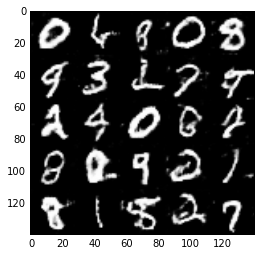

Epoch 4/10... Discriminator Loss: 1.1267... Generator Loss: 1.1155
Epoch 4/10... Discriminator Loss: 1.3095... Generator Loss: 0.4665
Epoch 4/10... Discriminator Loss: 1.1987... Generator Loss: 0.6324
Epoch 4/10... Discriminator Loss: 1.1486... Generator Loss: 1.0302
Epoch 4/10... Discriminator Loss: 1.0400... Generator Loss: 1.0998
Epoch 4/10... Discriminator Loss: 1.0333... Generator Loss: 1.6045
Epoch 4/10... Discriminator Loss: 1.0008... Generator Loss: 1.0605
Epoch 4/10... Discriminator Loss: 0.6563... Generator Loss: 1.2520
Epoch 4/10... Discriminator Loss: 1.0762... Generator Loss: 1.2741
Epoch 4/10... Discriminator Loss: 0.6048... Generator Loss: 1.5813


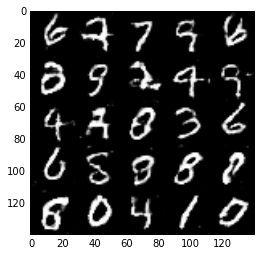

Epoch 4/10... Discriminator Loss: 1.1080... Generator Loss: 0.6406
Epoch 4/10... Discriminator Loss: 0.8621... Generator Loss: 1.0877
Epoch 4/10... Discriminator Loss: 1.4650... Generator Loss: 2.4867
Epoch 4/10... Discriminator Loss: 1.2077... Generator Loss: 0.9097
Epoch 4/10... Discriminator Loss: 1.8956... Generator Loss: 0.2175
Epoch 4/10... Discriminator Loss: 1.0275... Generator Loss: 0.7258
Epoch 4/10... Discriminator Loss: 1.0463... Generator Loss: 0.7965
Epoch 4/10... Discriminator Loss: 0.7655... Generator Loss: 1.1286
Epoch 4/10... Discriminator Loss: 1.8604... Generator Loss: 0.2938
Epoch 4/10... Discriminator Loss: 1.6085... Generator Loss: 0.4684


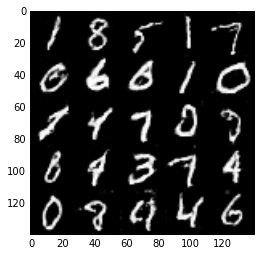

Epoch 4/10... Discriminator Loss: 1.4845... Generator Loss: 0.3915
Epoch 4/10... Discriminator Loss: 0.7185... Generator Loss: 1.1604
Epoch 4/10... Discriminator Loss: 1.0785... Generator Loss: 0.9431
Epoch 4/10... Discriminator Loss: 1.2517... Generator Loss: 1.0878
Epoch 4/10... Discriminator Loss: 1.1828... Generator Loss: 0.6499
Epoch 4/10... Discriminator Loss: 1.6012... Generator Loss: 0.3837
Epoch 4/10... Discriminator Loss: 1.0268... Generator Loss: 1.0609
Epoch 5/10... Discriminator Loss: 0.9802... Generator Loss: 0.9167
Epoch 5/10... Discriminator Loss: 1.2118... Generator Loss: 1.3237
Epoch 5/10... Discriminator Loss: 1.9223... Generator Loss: 0.2738


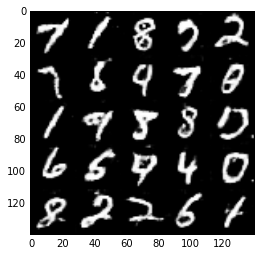

Epoch 5/10... Discriminator Loss: 1.0135... Generator Loss: 0.7202
Epoch 5/10... Discriminator Loss: 0.9485... Generator Loss: 1.9775
Epoch 5/10... Discriminator Loss: 1.2931... Generator Loss: 0.4809
Epoch 5/10... Discriminator Loss: 2.9381... Generator Loss: 0.1100
Epoch 5/10... Discriminator Loss: 1.0000... Generator Loss: 0.8713
Epoch 5/10... Discriminator Loss: 1.0555... Generator Loss: 0.8884
Epoch 5/10... Discriminator Loss: 1.0407... Generator Loss: 1.1237
Epoch 5/10... Discriminator Loss: 1.1026... Generator Loss: 2.2873
Epoch 5/10... Discriminator Loss: 1.1005... Generator Loss: 0.9567
Epoch 5/10... Discriminator Loss: 1.5991... Generator Loss: 0.3892


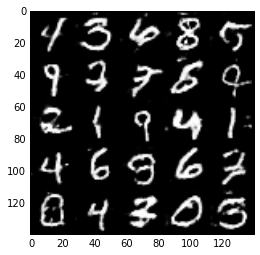

Epoch 5/10... Discriminator Loss: 2.1180... Generator Loss: 0.2494
Epoch 5/10... Discriminator Loss: 0.8705... Generator Loss: 1.1666
Epoch 5/10... Discriminator Loss: 1.5502... Generator Loss: 1.7988
Epoch 5/10... Discriminator Loss: 1.8377... Generator Loss: 0.3139
Epoch 5/10... Discriminator Loss: 1.1935... Generator Loss: 0.5594
Epoch 5/10... Discriminator Loss: 0.6889... Generator Loss: 2.3865
Epoch 5/10... Discriminator Loss: 1.0742... Generator Loss: 1.3817
Epoch 5/10... Discriminator Loss: 1.1550... Generator Loss: 2.3689
Epoch 5/10... Discriminator Loss: 1.6949... Generator Loss: 0.3509
Epoch 5/10... Discriminator Loss: 1.6599... Generator Loss: 0.4960


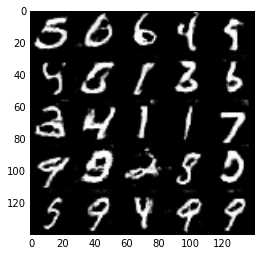

Epoch 5/10... Discriminator Loss: 1.3870... Generator Loss: 2.7522
Epoch 5/10... Discriminator Loss: 0.7148... Generator Loss: 1.3573
Epoch 5/10... Discriminator Loss: 2.0335... Generator Loss: 0.2539
Epoch 5/10... Discriminator Loss: 1.6162... Generator Loss: 0.4151
Epoch 5/10... Discriminator Loss: 1.5482... Generator Loss: 0.3599
Epoch 5/10... Discriminator Loss: 0.8832... Generator Loss: 1.3258
Epoch 5/10... Discriminator Loss: 1.1891... Generator Loss: 0.5352
Epoch 5/10... Discriminator Loss: 1.1927... Generator Loss: 0.5495
Epoch 5/10... Discriminator Loss: 1.7763... Generator Loss: 0.2999
Epoch 5/10... Discriminator Loss: 0.7618... Generator Loss: 1.5678


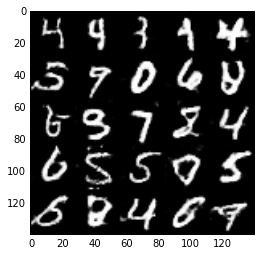

Epoch 5/10... Discriminator Loss: 1.1165... Generator Loss: 1.1770
Epoch 5/10... Discriminator Loss: 2.0362... Generator Loss: 0.2630
Epoch 5/10... Discriminator Loss: 1.5341... Generator Loss: 0.3614
Epoch 5/10... Discriminator Loss: 0.9794... Generator Loss: 0.7080
Epoch 5/10... Discriminator Loss: 0.7559... Generator Loss: 1.1102
Epoch 5/10... Discriminator Loss: 0.6734... Generator Loss: 1.0095
Epoch 5/10... Discriminator Loss: 1.1197... Generator Loss: 0.7264
Epoch 5/10... Discriminator Loss: 1.0617... Generator Loss: 0.7836
Epoch 5/10... Discriminator Loss: 0.9117... Generator Loss: 1.4634
Epoch 5/10... Discriminator Loss: 1.0148... Generator Loss: 2.0490


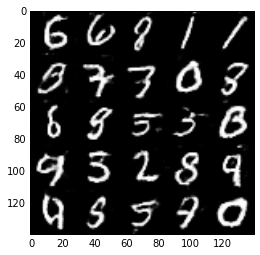

Epoch 5/10... Discriminator Loss: 0.9822... Generator Loss: 0.9987
Epoch 5/10... Discriminator Loss: 0.7473... Generator Loss: 1.0075
Epoch 5/10... Discriminator Loss: 2.0657... Generator Loss: 0.2020
Epoch 5/10... Discriminator Loss: 0.7349... Generator Loss: 1.4364
Epoch 6/10... Discriminator Loss: 1.0660... Generator Loss: 0.7795
Epoch 6/10... Discriminator Loss: 0.9216... Generator Loss: 1.2256
Epoch 6/10... Discriminator Loss: 1.0342... Generator Loss: 1.0320
Epoch 6/10... Discriminator Loss: 1.0684... Generator Loss: 0.6584
Epoch 6/10... Discriminator Loss: 2.1238... Generator Loss: 0.2203
Epoch 6/10... Discriminator Loss: 0.7628... Generator Loss: 1.3701


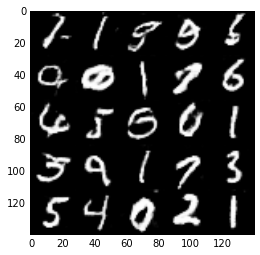

Epoch 6/10... Discriminator Loss: 0.9263... Generator Loss: 0.7329
Epoch 6/10... Discriminator Loss: 0.6258... Generator Loss: 1.2119
Epoch 6/10... Discriminator Loss: 0.9968... Generator Loss: 1.1032
Epoch 6/10... Discriminator Loss: 1.0755... Generator Loss: 1.9977
Epoch 6/10... Discriminator Loss: 0.9353... Generator Loss: 1.5755
Epoch 6/10... Discriminator Loss: 0.9507... Generator Loss: 0.8637
Epoch 6/10... Discriminator Loss: 1.4020... Generator Loss: 0.4815
Epoch 6/10... Discriminator Loss: 1.3850... Generator Loss: 0.4494
Epoch 6/10... Discriminator Loss: 1.1114... Generator Loss: 3.1564
Epoch 6/10... Discriminator Loss: 0.9150... Generator Loss: 1.0070


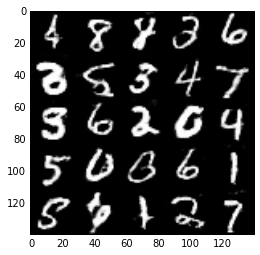

Epoch 6/10... Discriminator Loss: 4.1009... Generator Loss: 0.0481
Epoch 6/10... Discriminator Loss: 0.9527... Generator Loss: 1.2377
Epoch 6/10... Discriminator Loss: 1.4239... Generator Loss: 0.4947
Epoch 6/10... Discriminator Loss: 1.2550... Generator Loss: 0.5382
Epoch 6/10... Discriminator Loss: 0.7021... Generator Loss: 1.4196
Epoch 6/10... Discriminator Loss: 0.7270... Generator Loss: 0.9373
Epoch 6/10... Discriminator Loss: 2.1095... Generator Loss: 0.2681
Epoch 6/10... Discriminator Loss: 1.3523... Generator Loss: 0.4906
Epoch 6/10... Discriminator Loss: 0.8880... Generator Loss: 0.9126
Epoch 6/10... Discriminator Loss: 0.6295... Generator Loss: 1.1877


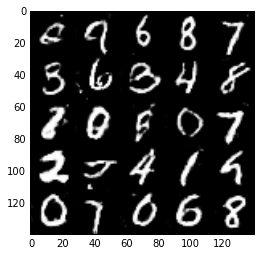

Epoch 6/10... Discriminator Loss: 1.3786... Generator Loss: 3.7747
Epoch 6/10... Discriminator Loss: 1.3054... Generator Loss: 0.4580
Epoch 6/10... Discriminator Loss: 0.8408... Generator Loss: 0.9464
Epoch 6/10... Discriminator Loss: 0.4343... Generator Loss: 1.9599
Epoch 6/10... Discriminator Loss: 0.6255... Generator Loss: 1.2510
Epoch 6/10... Discriminator Loss: 0.6097... Generator Loss: 1.1722
Epoch 6/10... Discriminator Loss: 0.8186... Generator Loss: 1.1020
Epoch 6/10... Discriminator Loss: 1.0017... Generator Loss: 1.3064
Epoch 6/10... Discriminator Loss: 0.9055... Generator Loss: 0.8459
Epoch 6/10... Discriminator Loss: 0.9281... Generator Loss: 2.5014


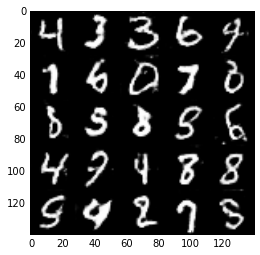

Epoch 6/10... Discriminator Loss: 0.8601... Generator Loss: 1.9472
Epoch 6/10... Discriminator Loss: 0.8909... Generator Loss: 0.9049
Epoch 6/10... Discriminator Loss: 2.8227... Generator Loss: 0.1483
Epoch 6/10... Discriminator Loss: 1.4972... Generator Loss: 0.4252
Epoch 6/10... Discriminator Loss: 0.6195... Generator Loss: 2.3000
Epoch 6/10... Discriminator Loss: 0.6088... Generator Loss: 1.3012
Epoch 6/10... Discriminator Loss: 1.2801... Generator Loss: 1.2891
Epoch 6/10... Discriminator Loss: 0.9697... Generator Loss: 0.8417
Epoch 6/10... Discriminator Loss: 1.4192... Generator Loss: 0.4817
Epoch 6/10... Discriminator Loss: 1.3381... Generator Loss: 0.4420


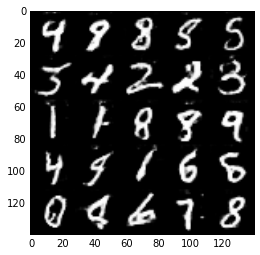

Epoch 7/10... Discriminator Loss: 1.0384... Generator Loss: 1.1036
Epoch 7/10... Discriminator Loss: 0.8161... Generator Loss: 0.9964
Epoch 7/10... Discriminator Loss: 0.7983... Generator Loss: 1.5988
Epoch 7/10... Discriminator Loss: 1.1942... Generator Loss: 2.8246
Epoch 7/10... Discriminator Loss: 0.7405... Generator Loss: 1.1584
Epoch 7/10... Discriminator Loss: 1.7309... Generator Loss: 0.3035
Epoch 7/10... Discriminator Loss: 0.8256... Generator Loss: 1.4005
Epoch 7/10... Discriminator Loss: 0.6401... Generator Loss: 1.2341
Epoch 7/10... Discriminator Loss: 0.7486... Generator Loss: 1.2923
Epoch 7/10... Discriminator Loss: 0.6826... Generator Loss: 1.1050


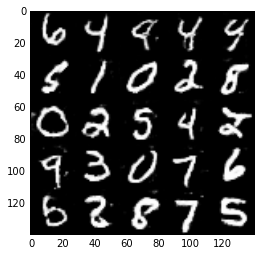

Epoch 7/10... Discriminator Loss: 0.5123... Generator Loss: 1.3081
Epoch 7/10... Discriminator Loss: 1.4081... Generator Loss: 3.6487
Epoch 7/10... Discriminator Loss: 2.3904... Generator Loss: 0.2010
Epoch 7/10... Discriminator Loss: 1.6692... Generator Loss: 0.4181
Epoch 7/10... Discriminator Loss: 1.8407... Generator Loss: 0.2776
Epoch 7/10... Discriminator Loss: 0.9952... Generator Loss: 0.7921
Epoch 7/10... Discriminator Loss: 1.7956... Generator Loss: 0.3179
Epoch 7/10... Discriminator Loss: 0.8492... Generator Loss: 0.8745
Epoch 7/10... Discriminator Loss: 0.5855... Generator Loss: 1.2120
Epoch 7/10... Discriminator Loss: 2.5343... Generator Loss: 0.1984


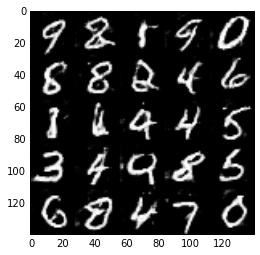

Epoch 7/10... Discriminator Loss: 0.5936... Generator Loss: 1.4246
Epoch 7/10... Discriminator Loss: 0.8446... Generator Loss: 2.1293
Epoch 7/10... Discriminator Loss: 0.9313... Generator Loss: 2.5636
Epoch 7/10... Discriminator Loss: 1.9488... Generator Loss: 0.3301
Epoch 7/10... Discriminator Loss: 1.6420... Generator Loss: 0.3388
Epoch 7/10... Discriminator Loss: 0.5580... Generator Loss: 1.5384
Epoch 7/10... Discriminator Loss: 0.7928... Generator Loss: 2.9370
Epoch 7/10... Discriminator Loss: 1.1563... Generator Loss: 0.7821
Epoch 7/10... Discriminator Loss: 2.0191... Generator Loss: 0.2352
Epoch 7/10... Discriminator Loss: 1.2558... Generator Loss: 0.5546


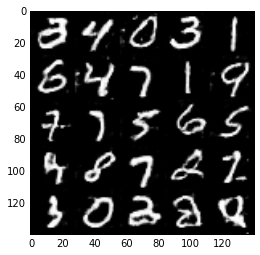

Epoch 7/10... Discriminator Loss: 1.4204... Generator Loss: 0.5085
Epoch 7/10... Discriminator Loss: 2.2181... Generator Loss: 4.4285
Epoch 7/10... Discriminator Loss: 0.8474... Generator Loss: 0.9079
Epoch 7/10... Discriminator Loss: 1.0898... Generator Loss: 2.7228
Epoch 7/10... Discriminator Loss: 1.7089... Generator Loss: 0.4560
Epoch 7/10... Discriminator Loss: 0.7983... Generator Loss: 1.4910
Epoch 7/10... Discriminator Loss: 0.5093... Generator Loss: 2.0097
Epoch 7/10... Discriminator Loss: 1.1438... Generator Loss: 2.2187
Epoch 7/10... Discriminator Loss: 0.8362... Generator Loss: 0.8380
Epoch 7/10... Discriminator Loss: 0.6312... Generator Loss: 1.4160


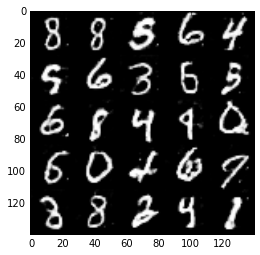

Epoch 7/10... Discriminator Loss: 1.7695... Generator Loss: 0.3593
Epoch 7/10... Discriminator Loss: 0.6951... Generator Loss: 1.4365
Epoch 7/10... Discriminator Loss: 0.6426... Generator Loss: 1.2406
Epoch 7/10... Discriminator Loss: 1.0009... Generator Loss: 2.3306
Epoch 7/10... Discriminator Loss: 1.4505... Generator Loss: 0.4851
Epoch 7/10... Discriminator Loss: 1.2156... Generator Loss: 0.5487
Epoch 7/10... Discriminator Loss: 1.0572... Generator Loss: 0.7048
Epoch 8/10... Discriminator Loss: 0.8052... Generator Loss: 1.0521
Epoch 8/10... Discriminator Loss: 0.9429... Generator Loss: 0.8051
Epoch 8/10... Discriminator Loss: 0.8635... Generator Loss: 1.2261


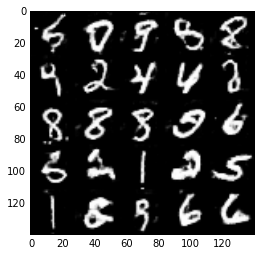

Epoch 8/10... Discriminator Loss: 2.0009... Generator Loss: 4.0889
Epoch 8/10... Discriminator Loss: 0.7428... Generator Loss: 1.8601
Epoch 8/10... Discriminator Loss: 1.2769... Generator Loss: 0.5874
Epoch 8/10... Discriminator Loss: 0.3405... Generator Loss: 1.8827
Epoch 8/10... Discriminator Loss: 0.9878... Generator Loss: 0.7986
Epoch 8/10... Discriminator Loss: 0.8828... Generator Loss: 0.9741
Epoch 8/10... Discriminator Loss: 1.2624... Generator Loss: 0.5604
Epoch 8/10... Discriminator Loss: 0.2073... Generator Loss: 3.3744
Epoch 8/10... Discriminator Loss: 1.1264... Generator Loss: 0.6216
Epoch 8/10... Discriminator Loss: 0.6777... Generator Loss: 1.0139


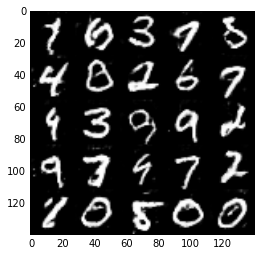

Epoch 8/10... Discriminator Loss: 1.7511... Generator Loss: 4.5137
Epoch 8/10... Discriminator Loss: 1.2982... Generator Loss: 1.4685
Epoch 8/10... Discriminator Loss: 0.7358... Generator Loss: 1.1953
Epoch 8/10... Discriminator Loss: 1.0422... Generator Loss: 1.8065
Epoch 8/10... Discriminator Loss: 0.6314... Generator Loss: 1.2778
Epoch 8/10... Discriminator Loss: 1.6654... Generator Loss: 0.3814
Epoch 8/10... Discriminator Loss: 1.9109... Generator Loss: 0.3138
Epoch 8/10... Discriminator Loss: 0.9336... Generator Loss: 0.7922
Epoch 8/10... Discriminator Loss: 1.0992... Generator Loss: 0.6346
Epoch 8/10... Discriminator Loss: 1.2192... Generator Loss: 0.5525


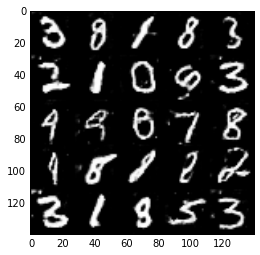

Epoch 8/10... Discriminator Loss: 3.0444... Generator Loss: 0.1635
Epoch 8/10... Discriminator Loss: 1.4117... Generator Loss: 0.4375
Epoch 8/10... Discriminator Loss: 0.9792... Generator Loss: 0.8451
Epoch 8/10... Discriminator Loss: 0.5443... Generator Loss: 1.3607
Epoch 8/10... Discriminator Loss: 1.2334... Generator Loss: 0.5669
Epoch 8/10... Discriminator Loss: 1.7781... Generator Loss: 0.3207
Epoch 8/10... Discriminator Loss: 1.2808... Generator Loss: 0.6107
Epoch 8/10... Discriminator Loss: 2.1369... Generator Loss: 0.2336
Epoch 8/10... Discriminator Loss: 1.8537... Generator Loss: 0.3371
Epoch 8/10... Discriminator Loss: 0.8424... Generator Loss: 1.0206


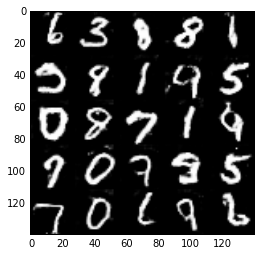

Epoch 8/10... Discriminator Loss: 1.1653... Generator Loss: 0.6113
Epoch 8/10... Discriminator Loss: 0.7088... Generator Loss: 1.0017
Epoch 8/10... Discriminator Loss: 0.7297... Generator Loss: 1.0583
Epoch 8/10... Discriminator Loss: 0.9231... Generator Loss: 1.0796
Epoch 8/10... Discriminator Loss: 1.2836... Generator Loss: 0.5461
Epoch 8/10... Discriminator Loss: 0.5473... Generator Loss: 1.6197
Epoch 8/10... Discriminator Loss: 0.9569... Generator Loss: 0.7990
Epoch 8/10... Discriminator Loss: 1.4486... Generator Loss: 0.4848
Epoch 8/10... Discriminator Loss: 0.4722... Generator Loss: 1.5089
Epoch 8/10... Discriminator Loss: 1.5014... Generator Loss: 3.3328


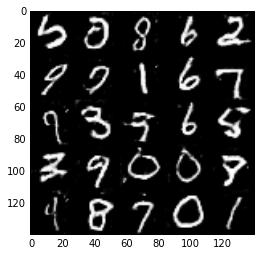

Epoch 8/10... Discriminator Loss: 0.5426... Generator Loss: 1.6984
Epoch 8/10... Discriminator Loss: 0.6810... Generator Loss: 1.3619
Epoch 8/10... Discriminator Loss: 0.6547... Generator Loss: 1.3381
Epoch 8/10... Discriminator Loss: 0.7050... Generator Loss: 1.2341
Epoch 9/10... Discriminator Loss: 0.2834... Generator Loss: 2.1786
Epoch 9/10... Discriminator Loss: 0.4693... Generator Loss: 2.1889
Epoch 9/10... Discriminator Loss: 1.7095... Generator Loss: 0.3464
Epoch 9/10... Discriminator Loss: 0.8491... Generator Loss: 1.1242
Epoch 9/10... Discriminator Loss: 0.9988... Generator Loss: 0.7709
Epoch 9/10... Discriminator Loss: 2.1063... Generator Loss: 0.2555


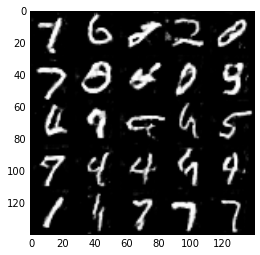

Epoch 9/10... Discriminator Loss: 1.4648... Generator Loss: 0.4410
Epoch 9/10... Discriminator Loss: 0.7118... Generator Loss: 1.7719
Epoch 9/10... Discriminator Loss: 0.9572... Generator Loss: 0.7332
Epoch 9/10... Discriminator Loss: 0.6840... Generator Loss: 1.2314
Epoch 9/10... Discriminator Loss: 0.7083... Generator Loss: 0.9954
Epoch 9/10... Discriminator Loss: 0.8066... Generator Loss: 1.0316
Epoch 9/10... Discriminator Loss: 0.4160... Generator Loss: 1.5728
Epoch 9/10... Discriminator Loss: 0.9835... Generator Loss: 3.5964
Epoch 9/10... Discriminator Loss: 2.3628... Generator Loss: 0.2488
Epoch 9/10... Discriminator Loss: 0.7904... Generator Loss: 1.7359


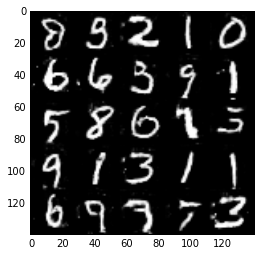

Epoch 9/10... Discriminator Loss: 0.8403... Generator Loss: 1.1518
Epoch 9/10... Discriminator Loss: 0.6736... Generator Loss: 1.1236
Epoch 9/10... Discriminator Loss: 0.7330... Generator Loss: 1.0157
Epoch 9/10... Discriminator Loss: 0.7923... Generator Loss: 0.9765
Epoch 9/10... Discriminator Loss: 0.4847... Generator Loss: 1.3736
Epoch 9/10... Discriminator Loss: 3.3592... Generator Loss: 0.1052
Epoch 9/10... Discriminator Loss: 1.3646... Generator Loss: 1.5354
Epoch 9/10... Discriminator Loss: 0.8056... Generator Loss: 1.4645
Epoch 9/10... Discriminator Loss: 0.7110... Generator Loss: 1.4477
Epoch 9/10... Discriminator Loss: 2.3135... Generator Loss: 0.2056


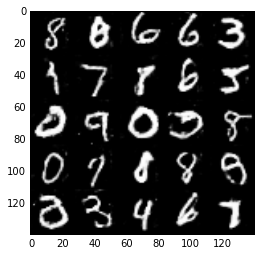

Epoch 9/10... Discriminator Loss: 0.6908... Generator Loss: 1.1057
Epoch 9/10... Discriminator Loss: 1.1768... Generator Loss: 0.5862
Epoch 9/10... Discriminator Loss: 0.7714... Generator Loss: 1.0054
Epoch 9/10... Discriminator Loss: 0.8420... Generator Loss: 0.7854
Epoch 9/10... Discriminator Loss: 0.6516... Generator Loss: 1.2383
Epoch 9/10... Discriminator Loss: 1.0930... Generator Loss: 2.7160
Epoch 9/10... Discriminator Loss: 2.0168... Generator Loss: 0.3425
Epoch 9/10... Discriminator Loss: 0.9181... Generator Loss: 0.7862
Epoch 9/10... Discriminator Loss: 0.9625... Generator Loss: 0.6797
Epoch 9/10... Discriminator Loss: 0.7774... Generator Loss: 0.9549


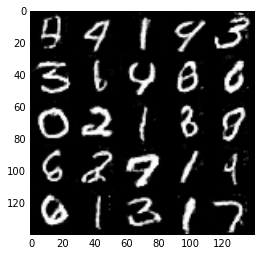

Epoch 9/10... Discriminator Loss: 1.9696... Generator Loss: 0.3299
Epoch 9/10... Discriminator Loss: 0.8365... Generator Loss: 0.9250
Epoch 9/10... Discriminator Loss: 1.7027... Generator Loss: 0.4104
Epoch 9/10... Discriminator Loss: 2.2311... Generator Loss: 0.2330
Epoch 9/10... Discriminator Loss: 0.2775... Generator Loss: 2.2209
Epoch 9/10... Discriminator Loss: 0.2727... Generator Loss: 2.0137
Epoch 9/10... Discriminator Loss: 0.4876... Generator Loss: 1.3576
Epoch 9/10... Discriminator Loss: 0.7944... Generator Loss: 1.7958
Epoch 9/10... Discriminator Loss: 0.5772... Generator Loss: 1.3930
Epoch 9/10... Discriminator Loss: 1.7814... Generator Loss: 0.4201


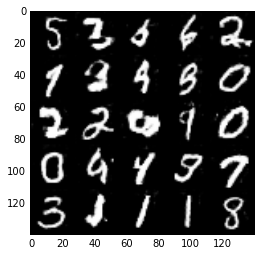

Epoch 9/10... Discriminator Loss: 0.6991... Generator Loss: 1.5961
Epoch 10/10... Discriminator Loss: 1.6080... Generator Loss: 3.1732
Epoch 10/10... Discriminator Loss: 0.6922... Generator Loss: 1.5355
Epoch 10/10... Discriminator Loss: 1.3807... Generator Loss: 3.2209
Epoch 10/10... Discriminator Loss: 0.6392... Generator Loss: 1.3693
Epoch 10/10... Discriminator Loss: 0.7549... Generator Loss: 0.9518
Epoch 10/10... Discriminator Loss: 1.3166... Generator Loss: 0.5138
Epoch 10/10... Discriminator Loss: 0.3483... Generator Loss: 1.8153
Epoch 10/10... Discriminator Loss: 0.6404... Generator Loss: 1.2320
Epoch 10/10... Discriminator Loss: 0.6541... Generator Loss: 1.2097


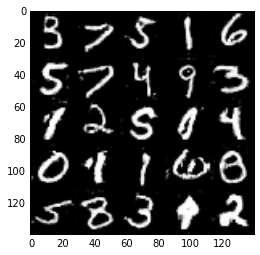

Epoch 10/10... Discriminator Loss: 1.4963... Generator Loss: 0.4306
Epoch 10/10... Discriminator Loss: 1.3855... Generator Loss: 0.5184
Epoch 10/10... Discriminator Loss: 0.9017... Generator Loss: 3.2496
Epoch 10/10... Discriminator Loss: 0.9748... Generator Loss: 1.7231
Epoch 10/10... Discriminator Loss: 0.8887... Generator Loss: 0.9972
Epoch 10/10... Discriminator Loss: 1.7696... Generator Loss: 0.3332
Epoch 10/10... Discriminator Loss: 0.6827... Generator Loss: 1.1206
Epoch 10/10... Discriminator Loss: 2.2439... Generator Loss: 0.2524
Epoch 10/10... Discriminator Loss: 0.6319... Generator Loss: 1.6557
Epoch 10/10... Discriminator Loss: 0.4894... Generator Loss: 1.3550


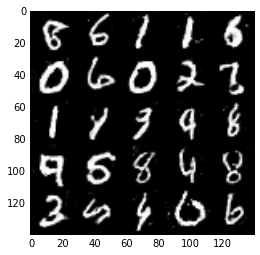

Epoch 10/10... Discriminator Loss: 1.0459... Generator Loss: 0.7006
Epoch 10/10... Discriminator Loss: 0.7838... Generator Loss: 3.3930
Epoch 10/10... Discriminator Loss: 0.6410... Generator Loss: 1.3488
Epoch 10/10... Discriminator Loss: 1.0585... Generator Loss: 0.7076
Epoch 10/10... Discriminator Loss: 0.3860... Generator Loss: 1.7266
Epoch 10/10... Discriminator Loss: 0.4039... Generator Loss: 1.5480
Epoch 10/10... Discriminator Loss: 0.5268... Generator Loss: 1.3252
Epoch 10/10... Discriminator Loss: 0.9757... Generator Loss: 4.3543
Epoch 10/10... Discriminator Loss: 1.7380... Generator Loss: 0.4273
Epoch 10/10... Discriminator Loss: 1.4538... Generator Loss: 0.4694


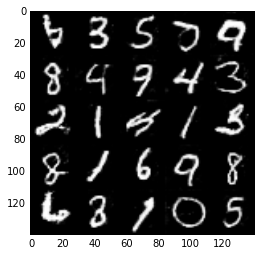

Epoch 10/10... Discriminator Loss: 0.8244... Generator Loss: 0.9202
Epoch 10/10... Discriminator Loss: 0.9279... Generator Loss: 0.8661
Epoch 10/10... Discriminator Loss: 0.7786... Generator Loss: 0.9439
Epoch 10/10... Discriminator Loss: 0.7007... Generator Loss: 1.0278
Epoch 10/10... Discriminator Loss: 0.7510... Generator Loss: 1.7428
Epoch 10/10... Discriminator Loss: 0.6475... Generator Loss: 1.2530
Epoch 10/10... Discriminator Loss: 0.9935... Generator Loss: 2.3222
Epoch 10/10... Discriminator Loss: 0.6196... Generator Loss: 1.4821
Epoch 10/10... Discriminator Loss: 1.4039... Generator Loss: 3.9516
Epoch 10/10... Discriminator Loss: 1.2722... Generator Loss: 0.5762


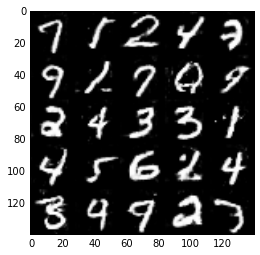

Epoch 10/10... Discriminator Loss: 0.4219... Generator Loss: 2.4807
Epoch 10/10... Discriminator Loss: 1.2144... Generator Loss: 4.5731
Epoch 10/10... Discriminator Loss: 2.8042... Generator Loss: 0.1442
Epoch 10/10... Discriminator Loss: 1.2152... Generator Loss: 0.6014
Epoch 10/10... Discriminator Loss: 0.8574... Generator Loss: 2.1168
Epoch 10/10... Discriminator Loss: 1.2790... Generator Loss: 0.5708
Epoch 10/10... Discriminator Loss: 2.5648... Generator Loss: 0.1598
Epoch 10/10... Discriminator Loss: 1.2138... Generator Loss: 0.5922


In [80]:
batch_size = 128
z_dim = 150
learning_rate = 0.006
beta1 = 0.4


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 10

mnist_dataset = helper.Dataset('mnist', glob(os.path.join(data_dir, 'mnist/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, mnist_dataset.get_batches,
          mnist_dataset.shape, mnist_dataset.image_mode)

### CelebA
Run your GANs on CelebA.  It will take around 20 minutes on the average GPU to run one epoch.  You can run the whole epoch or stop when it starts to generate realistic faces.

Epoch 1/10... Discriminator Loss: 3.2955... Generator Loss: 1.4457
Epoch 1/10... Discriminator Loss: 0.4697... Generator Loss: 2.3992
Epoch 1/10... Discriminator Loss: 2.4496... Generator Loss: 4.7642
Epoch 1/10... Discriminator Loss: 3.7626... Generator Loss: 0.1165
Epoch 1/10... Discriminator Loss: 1.3070... Generator Loss: 1.7049
Epoch 1/10... Discriminator Loss: 1.6812... Generator Loss: 0.3550
Epoch 1/10... Discriminator Loss: 1.3729... Generator Loss: 6.8370
Epoch 1/10... Discriminator Loss: 0.6157... Generator Loss: 1.5868
Epoch 1/10... Discriminator Loss: 2.2818... Generator Loss: 3.4779
Epoch 1/10... Discriminator Loss: 0.4003... Generator Loss: 2.2919


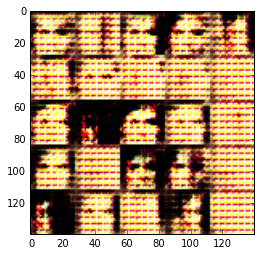

Epoch 1/10... Discriminator Loss: 2.2003... Generator Loss: 0.4362
Epoch 1/10... Discriminator Loss: 0.3770... Generator Loss: 2.5870
Epoch 1/10... Discriminator Loss: 0.6069... Generator Loss: 2.0625
Epoch 1/10... Discriminator Loss: 0.6062... Generator Loss: 3.2393
Epoch 1/10... Discriminator Loss: 0.2532... Generator Loss: 2.7486
Epoch 1/10... Discriminator Loss: 0.9448... Generator Loss: 1.8106
Epoch 1/10... Discriminator Loss: 0.2050... Generator Loss: 2.7366
Epoch 1/10... Discriminator Loss: 1.1068... Generator Loss: 1.0055
Epoch 1/10... Discriminator Loss: 1.9430... Generator Loss: 0.2504
Epoch 1/10... Discriminator Loss: 1.0052... Generator Loss: 1.4235


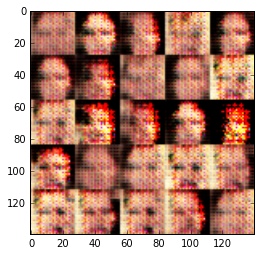

Epoch 1/10... Discriminator Loss: 0.8044... Generator Loss: 1.0759
Epoch 1/10... Discriminator Loss: 0.5870... Generator Loss: 1.3367
Epoch 1/10... Discriminator Loss: 1.3159... Generator Loss: 0.7869
Epoch 1/10... Discriminator Loss: 1.2337... Generator Loss: 0.8394
Epoch 1/10... Discriminator Loss: 0.9552... Generator Loss: 0.9085
Epoch 1/10... Discriminator Loss: 0.9427... Generator Loss: 1.1318
Epoch 1/10... Discriminator Loss: 0.7700... Generator Loss: 1.2559
Epoch 1/10... Discriminator Loss: 2.5813... Generator Loss: 3.4719
Epoch 1/10... Discriminator Loss: 0.9689... Generator Loss: 0.8740
Epoch 1/10... Discriminator Loss: 1.3185... Generator Loss: 2.3705


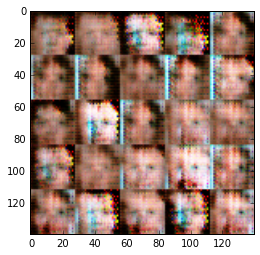

Epoch 1/10... Discriminator Loss: 1.2892... Generator Loss: 0.6543
Epoch 1/10... Discriminator Loss: 0.9799... Generator Loss: 1.0826
Epoch 1/10... Discriminator Loss: 1.4329... Generator Loss: 0.7859
Epoch 1/10... Discriminator Loss: 1.4098... Generator Loss: 0.9928
Epoch 1/10... Discriminator Loss: 1.1984... Generator Loss: 0.7712
Epoch 1/10... Discriminator Loss: 1.0478... Generator Loss: 0.6889
Epoch 1/10... Discriminator Loss: 1.2006... Generator Loss: 0.9054
Epoch 1/10... Discriminator Loss: 1.1699... Generator Loss: 1.0359
Epoch 1/10... Discriminator Loss: 1.1702... Generator Loss: 0.7376
Epoch 1/10... Discriminator Loss: 0.7711... Generator Loss: 1.1581


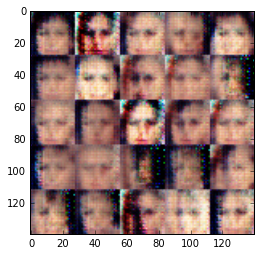

Epoch 1/10... Discriminator Loss: 1.0689... Generator Loss: 1.1875
Epoch 1/10... Discriminator Loss: 1.2830... Generator Loss: 1.1170
Epoch 1/10... Discriminator Loss: 1.4174... Generator Loss: 0.6214
Epoch 1/10... Discriminator Loss: 1.0368... Generator Loss: 1.3463
Epoch 1/10... Discriminator Loss: 1.2490... Generator Loss: 1.1250
Epoch 1/10... Discriminator Loss: 1.0292... Generator Loss: 1.1824
Epoch 1/10... Discriminator Loss: 1.0339... Generator Loss: 0.8630
Epoch 1/10... Discriminator Loss: 1.0515... Generator Loss: 0.7067
Epoch 1/10... Discriminator Loss: 1.3081... Generator Loss: 1.1571
Epoch 1/10... Discriminator Loss: 1.0399... Generator Loss: 1.4100


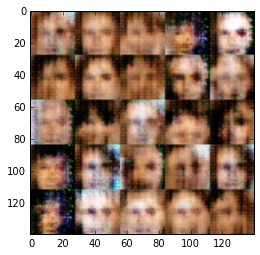

Epoch 1/10... Discriminator Loss: 1.1772... Generator Loss: 0.5706
Epoch 1/10... Discriminator Loss: 1.1782... Generator Loss: 0.9042
Epoch 1/10... Discriminator Loss: 0.9801... Generator Loss: 0.8476
Epoch 1/10... Discriminator Loss: 1.8192... Generator Loss: 0.2619
Epoch 1/10... Discriminator Loss: 1.1565... Generator Loss: 1.0950
Epoch 1/10... Discriminator Loss: 1.1514... Generator Loss: 1.0252
Epoch 1/10... Discriminator Loss: 1.3550... Generator Loss: 0.8581
Epoch 1/10... Discriminator Loss: 1.2543... Generator Loss: 0.9368
Epoch 1/10... Discriminator Loss: 2.3056... Generator Loss: 2.6531
Epoch 1/10... Discriminator Loss: 1.3388... Generator Loss: 0.7662


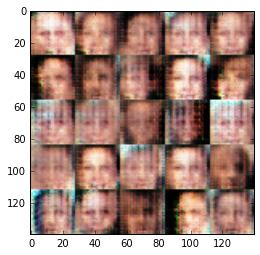

Epoch 1/10... Discriminator Loss: 1.8631... Generator Loss: 2.3305
Epoch 1/10... Discriminator Loss: 1.2648... Generator Loss: 0.6656
Epoch 1/10... Discriminator Loss: 1.1664... Generator Loss: 1.0787
Epoch 1/10... Discriminator Loss: 1.6089... Generator Loss: 1.2103
Epoch 1/10... Discriminator Loss: 1.3919... Generator Loss: 0.8181
Epoch 1/10... Discriminator Loss: 0.9516... Generator Loss: 0.9501
Epoch 1/10... Discriminator Loss: 1.2501... Generator Loss: 0.7331
Epoch 1/10... Discriminator Loss: 1.1618... Generator Loss: 0.6755
Epoch 1/10... Discriminator Loss: 1.2613... Generator Loss: 0.8642
Epoch 1/10... Discriminator Loss: 2.0846... Generator Loss: 2.6272


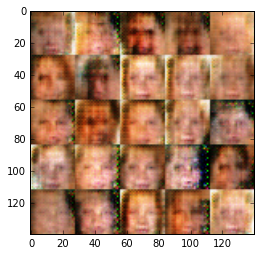

Epoch 1/10... Discriminator Loss: 1.4204... Generator Loss: 0.5569
Epoch 1/10... Discriminator Loss: 0.9306... Generator Loss: 0.9867
Epoch 1/10... Discriminator Loss: 1.5051... Generator Loss: 0.9482
Epoch 1/10... Discriminator Loss: 1.3391... Generator Loss: 0.8471
Epoch 1/10... Discriminator Loss: 1.3232... Generator Loss: 0.4873
Epoch 1/10... Discriminator Loss: 1.1316... Generator Loss: 0.9187
Epoch 1/10... Discriminator Loss: 1.5766... Generator Loss: 0.3560
Epoch 1/10... Discriminator Loss: 1.3907... Generator Loss: 0.5355
Epoch 1/10... Discriminator Loss: 1.1770... Generator Loss: 1.4032
Epoch 2/10... Discriminator Loss: 1.6684... Generator Loss: 0.3154


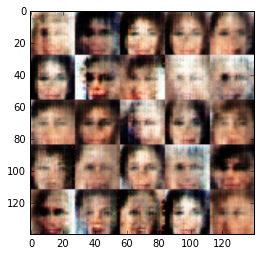

Epoch 2/10... Discriminator Loss: 1.2755... Generator Loss: 0.7220
Epoch 2/10... Discriminator Loss: 1.3511... Generator Loss: 1.3574
Epoch 2/10... Discriminator Loss: 1.4942... Generator Loss: 0.7292
Epoch 2/10... Discriminator Loss: 2.4041... Generator Loss: 2.9232
Epoch 2/10... Discriminator Loss: 1.0724... Generator Loss: 0.8269
Epoch 2/10... Discriminator Loss: 1.1887... Generator Loss: 0.6615
Epoch 2/10... Discriminator Loss: 1.0961... Generator Loss: 0.9889
Epoch 2/10... Discriminator Loss: 1.3301... Generator Loss: 1.3929
Epoch 2/10... Discriminator Loss: 1.2784... Generator Loss: 0.8395
Epoch 2/10... Discriminator Loss: 1.2208... Generator Loss: 0.8062


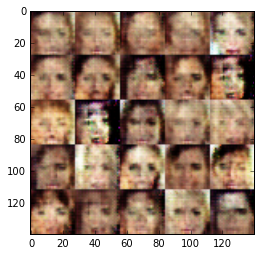

Epoch 2/10... Discriminator Loss: 1.2361... Generator Loss: 1.2754
Epoch 2/10... Discriminator Loss: 1.5153... Generator Loss: 0.4307
Epoch 2/10... Discriminator Loss: 1.0954... Generator Loss: 0.8597
Epoch 2/10... Discriminator Loss: 1.0399... Generator Loss: 0.9072
Epoch 2/10... Discriminator Loss: 1.2805... Generator Loss: 0.5925
Epoch 2/10... Discriminator Loss: 0.9870... Generator Loss: 1.1722
Epoch 2/10... Discriminator Loss: 1.0828... Generator Loss: 1.0506
Epoch 2/10... Discriminator Loss: 1.3843... Generator Loss: 0.5986
Epoch 2/10... Discriminator Loss: 1.3826... Generator Loss: 0.7936
Epoch 2/10... Discriminator Loss: 1.5003... Generator Loss: 0.9473


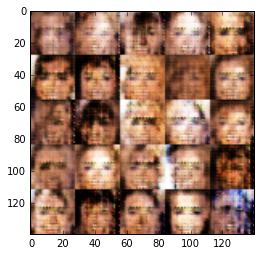

Epoch 2/10... Discriminator Loss: 1.6257... Generator Loss: 0.5646
Epoch 2/10... Discriminator Loss: 0.7449... Generator Loss: 1.0977
Epoch 2/10... Discriminator Loss: 1.0662... Generator Loss: 1.1042
Epoch 2/10... Discriminator Loss: 1.2028... Generator Loss: 0.7142
Epoch 2/10... Discriminator Loss: 1.1610... Generator Loss: 0.6094
Epoch 2/10... Discriminator Loss: 1.1909... Generator Loss: 0.7479
Epoch 2/10... Discriminator Loss: 1.2645... Generator Loss: 0.7787
Epoch 2/10... Discriminator Loss: 1.6314... Generator Loss: 2.3161
Epoch 2/10... Discriminator Loss: 1.3460... Generator Loss: 0.8357
Epoch 2/10... Discriminator Loss: 1.1383... Generator Loss: 0.8172


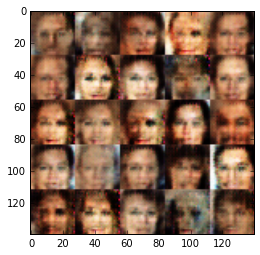

Epoch 2/10... Discriminator Loss: 0.9841... Generator Loss: 1.1615
Epoch 2/10... Discriminator Loss: 1.0368... Generator Loss: 0.7826
Epoch 2/10... Discriminator Loss: 1.0118... Generator Loss: 0.7718
Epoch 2/10... Discriminator Loss: 1.2647... Generator Loss: 1.8314
Epoch 2/10... Discriminator Loss: 1.2680... Generator Loss: 1.7533
Epoch 2/10... Discriminator Loss: 1.3254... Generator Loss: 0.6409
Epoch 2/10... Discriminator Loss: 0.9907... Generator Loss: 1.3586
Epoch 2/10... Discriminator Loss: 1.3925... Generator Loss: 1.2501
Epoch 2/10... Discriminator Loss: 2.4036... Generator Loss: 3.0227
Epoch 2/10... Discriminator Loss: 1.0806... Generator Loss: 0.6522


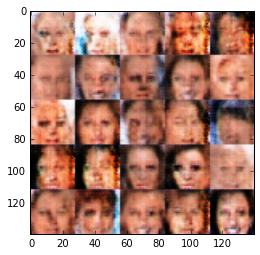

Epoch 2/10... Discriminator Loss: 0.9776... Generator Loss: 1.0372
Epoch 2/10... Discriminator Loss: 0.9622... Generator Loss: 1.0263
Epoch 2/10... Discriminator Loss: 1.3525... Generator Loss: 0.7191
Epoch 2/10... Discriminator Loss: 1.2360... Generator Loss: 1.0016
Epoch 2/10... Discriminator Loss: 1.0642... Generator Loss: 0.9351
Epoch 2/10... Discriminator Loss: 1.2096... Generator Loss: 0.9117
Epoch 2/10... Discriminator Loss: 1.6448... Generator Loss: 2.2747
Epoch 2/10... Discriminator Loss: 1.4273... Generator Loss: 0.7189
Epoch 2/10... Discriminator Loss: 0.8807... Generator Loss: 0.8244
Epoch 2/10... Discriminator Loss: 1.2622... Generator Loss: 0.7051


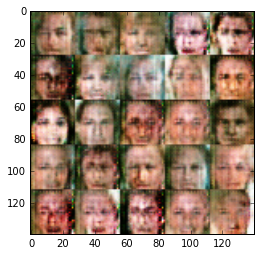

Epoch 2/10... Discriminator Loss: 1.0542... Generator Loss: 1.2395
Epoch 2/10... Discriminator Loss: 1.3547... Generator Loss: 2.4512
Epoch 2/10... Discriminator Loss: 1.2802... Generator Loss: 1.1500
Epoch 2/10... Discriminator Loss: 0.9230... Generator Loss: 1.0119
Epoch 2/10... Discriminator Loss: 1.1008... Generator Loss: 0.9995
Epoch 2/10... Discriminator Loss: 1.1705... Generator Loss: 0.7276
Epoch 2/10... Discriminator Loss: 1.1996... Generator Loss: 0.7008
Epoch 2/10... Discriminator Loss: 1.2026... Generator Loss: 0.8848
Epoch 2/10... Discriminator Loss: 1.3166... Generator Loss: 1.0497
Epoch 2/10... Discriminator Loss: 1.2325... Generator Loss: 0.6898


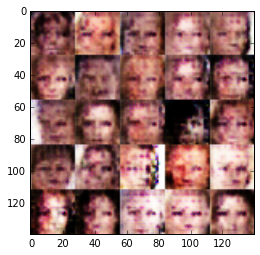

Epoch 2/10... Discriminator Loss: 1.2014... Generator Loss: 0.9543
Epoch 2/10... Discriminator Loss: 1.0749... Generator Loss: 0.7880
Epoch 2/10... Discriminator Loss: 1.1629... Generator Loss: 0.9883
Epoch 2/10... Discriminator Loss: 1.2524... Generator Loss: 0.7114
Epoch 2/10... Discriminator Loss: 1.2290... Generator Loss: 1.0153
Epoch 2/10... Discriminator Loss: 1.1352... Generator Loss: 0.8190
Epoch 2/10... Discriminator Loss: 1.0893... Generator Loss: 0.8312
Epoch 2/10... Discriminator Loss: 1.3467... Generator Loss: 0.7243
Epoch 2/10... Discriminator Loss: 1.2444... Generator Loss: 0.9755
Epoch 2/10... Discriminator Loss: 1.5697... Generator Loss: 2.3482


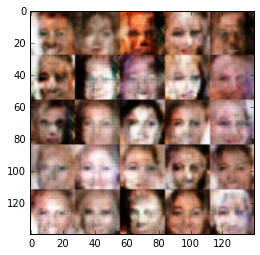

Epoch 2/10... Discriminator Loss: 1.2011... Generator Loss: 0.7464
Epoch 2/10... Discriminator Loss: 1.1461... Generator Loss: 1.0825
Epoch 2/10... Discriminator Loss: 1.4399... Generator Loss: 0.5233
Epoch 2/10... Discriminator Loss: 1.5544... Generator Loss: 1.6082
Epoch 2/10... Discriminator Loss: 1.0311... Generator Loss: 1.0009
Epoch 2/10... Discriminator Loss: 1.2760... Generator Loss: 1.2709
Epoch 2/10... Discriminator Loss: 1.2375... Generator Loss: 0.6294
Epoch 2/10... Discriminator Loss: 1.1391... Generator Loss: 1.8030
Epoch 3/10... Discriminator Loss: 1.1886... Generator Loss: 0.6786
Epoch 3/10... Discriminator Loss: 1.2400... Generator Loss: 1.0677


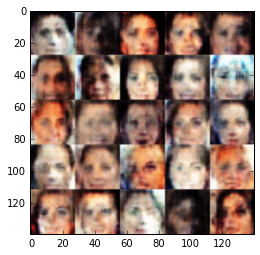

Epoch 3/10... Discriminator Loss: 0.9433... Generator Loss: 1.0661
Epoch 3/10... Discriminator Loss: 1.4706... Generator Loss: 2.6638
Epoch 3/10... Discriminator Loss: 1.1829... Generator Loss: 0.7403
Epoch 3/10... Discriminator Loss: 1.1608... Generator Loss: 1.1094
Epoch 3/10... Discriminator Loss: 1.1287... Generator Loss: 0.7741
Epoch 3/10... Discriminator Loss: 1.1778... Generator Loss: 1.0532
Epoch 3/10... Discriminator Loss: 1.2900... Generator Loss: 1.0450
Epoch 3/10... Discriminator Loss: 1.3523... Generator Loss: 0.6977
Epoch 3/10... Discriminator Loss: 1.4700... Generator Loss: 1.4907
Epoch 3/10... Discriminator Loss: 1.4610... Generator Loss: 2.6160


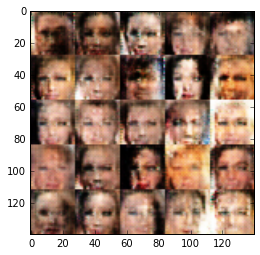

Epoch 3/10... Discriminator Loss: 1.1216... Generator Loss: 0.8744
Epoch 3/10... Discriminator Loss: 1.4325... Generator Loss: 0.4428
Epoch 3/10... Discriminator Loss: 1.1727... Generator Loss: 1.1750
Epoch 3/10... Discriminator Loss: 1.7108... Generator Loss: 0.3869
Epoch 3/10... Discriminator Loss: 1.3681... Generator Loss: 0.9744
Epoch 3/10... Discriminator Loss: 1.3304... Generator Loss: 1.7179
Epoch 3/10... Discriminator Loss: 1.1116... Generator Loss: 1.0330
Epoch 3/10... Discriminator Loss: 1.2252... Generator Loss: 0.9890
Epoch 3/10... Discriminator Loss: 1.1211... Generator Loss: 0.6526
Epoch 3/10... Discriminator Loss: 1.2366... Generator Loss: 0.5550


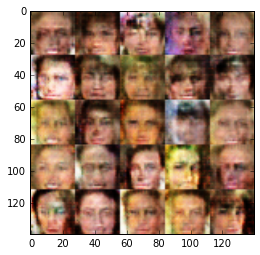

Epoch 3/10... Discriminator Loss: 1.4943... Generator Loss: 0.5170
Epoch 3/10... Discriminator Loss: 1.1599... Generator Loss: 1.0129
Epoch 3/10... Discriminator Loss: 0.8715... Generator Loss: 1.0102
Epoch 3/10... Discriminator Loss: 1.1574... Generator Loss: 1.1192
Epoch 3/10... Discriminator Loss: 1.5138... Generator Loss: 1.6000
Epoch 3/10... Discriminator Loss: 1.1934... Generator Loss: 0.7195
Epoch 3/10... Discriminator Loss: 1.0371... Generator Loss: 1.1666
Epoch 3/10... Discriminator Loss: 1.0348... Generator Loss: 0.7917
Epoch 3/10... Discriminator Loss: 1.2104... Generator Loss: 0.9186
Epoch 3/10... Discriminator Loss: 1.0138... Generator Loss: 1.2068


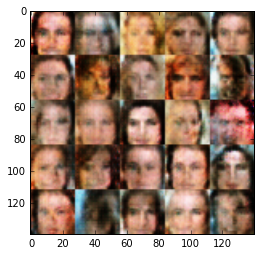

Epoch 3/10... Discriminator Loss: 1.2173... Generator Loss: 1.4790
Epoch 3/10... Discriminator Loss: 1.2321... Generator Loss: 0.6033
Epoch 3/10... Discriminator Loss: 1.4716... Generator Loss: 2.0016
Epoch 3/10... Discriminator Loss: 1.3209... Generator Loss: 0.9024
Epoch 3/10... Discriminator Loss: 1.3659... Generator Loss: 1.6702
Epoch 3/10... Discriminator Loss: 1.2014... Generator Loss: 0.8596
Epoch 3/10... Discriminator Loss: 1.2200... Generator Loss: 0.6900
Epoch 3/10... Discriminator Loss: 1.1185... Generator Loss: 0.8580
Epoch 3/10... Discriminator Loss: 1.2563... Generator Loss: 1.0904
Epoch 3/10... Discriminator Loss: 1.2438... Generator Loss: 0.9963


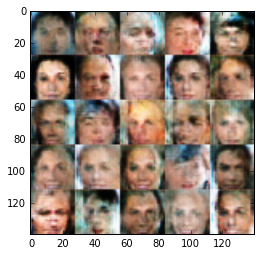

Epoch 3/10... Discriminator Loss: 1.3027... Generator Loss: 1.9684
Epoch 3/10... Discriminator Loss: 1.1638... Generator Loss: 0.7359
Epoch 3/10... Discriminator Loss: 1.2881... Generator Loss: 0.7504
Epoch 3/10... Discriminator Loss: 1.2945... Generator Loss: 0.5702
Epoch 3/10... Discriminator Loss: 1.1880... Generator Loss: 1.1430
Epoch 3/10... Discriminator Loss: 1.2365... Generator Loss: 0.8039
Epoch 3/10... Discriminator Loss: 1.0267... Generator Loss: 1.0955
Epoch 3/10... Discriminator Loss: 0.9927... Generator Loss: 0.9020
Epoch 3/10... Discriminator Loss: 1.2779... Generator Loss: 1.1812
Epoch 3/10... Discriminator Loss: 1.3035... Generator Loss: 0.5271


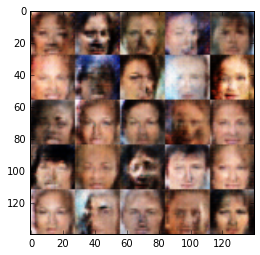

Epoch 3/10... Discriminator Loss: 1.2064... Generator Loss: 0.7562
Epoch 3/10... Discriminator Loss: 1.3875... Generator Loss: 0.4381
Epoch 3/10... Discriminator Loss: 1.3084... Generator Loss: 0.8520
Epoch 3/10... Discriminator Loss: 1.3197... Generator Loss: 0.9317
Epoch 3/10... Discriminator Loss: 1.2177... Generator Loss: 1.1030
Epoch 3/10... Discriminator Loss: 1.3832... Generator Loss: 0.5850
Epoch 3/10... Discriminator Loss: 1.1347... Generator Loss: 0.6598
Epoch 3/10... Discriminator Loss: 1.4391... Generator Loss: 1.1897
Epoch 3/10... Discriminator Loss: 1.1374... Generator Loss: 1.1686
Epoch 3/10... Discriminator Loss: 1.2194... Generator Loss: 0.8972


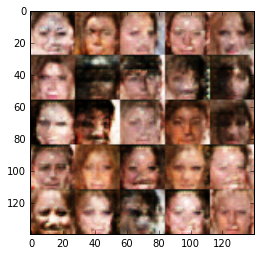

Epoch 3/10... Discriminator Loss: 1.2711... Generator Loss: 1.2478
Epoch 3/10... Discriminator Loss: 2.0050... Generator Loss: 0.2306
Epoch 3/10... Discriminator Loss: 1.1433... Generator Loss: 0.8342
Epoch 3/10... Discriminator Loss: 1.1172... Generator Loss: 0.7122
Epoch 3/10... Discriminator Loss: 1.8918... Generator Loss: 0.2475
Epoch 3/10... Discriminator Loss: 1.2591... Generator Loss: 0.8292
Epoch 3/10... Discriminator Loss: 1.2218... Generator Loss: 0.6204
Epoch 3/10... Discriminator Loss: 1.0836... Generator Loss: 1.0884
Epoch 3/10... Discriminator Loss: 1.6195... Generator Loss: 0.3590
Epoch 3/10... Discriminator Loss: 1.2206... Generator Loss: 0.7954


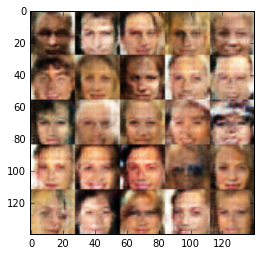

Epoch 3/10... Discriminator Loss: 1.0818... Generator Loss: 0.7959
Epoch 3/10... Discriminator Loss: 1.6761... Generator Loss: 1.5884
Epoch 3/10... Discriminator Loss: 1.1870... Generator Loss: 0.9785
Epoch 3/10... Discriminator Loss: 1.1653... Generator Loss: 0.7837
Epoch 3/10... Discriminator Loss: 1.1985... Generator Loss: 1.3135
Epoch 3/10... Discriminator Loss: 1.2691... Generator Loss: 0.5574
Epoch 3/10... Discriminator Loss: 1.3754... Generator Loss: 0.5013
Epoch 4/10... Discriminator Loss: 1.3001... Generator Loss: 1.1111
Epoch 4/10... Discriminator Loss: 1.1515... Generator Loss: 1.3037
Epoch 4/10... Discriminator Loss: 1.3216... Generator Loss: 1.3767


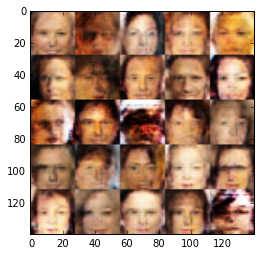

Epoch 4/10... Discriminator Loss: 1.3254... Generator Loss: 1.1482
Epoch 4/10... Discriminator Loss: 1.0625... Generator Loss: 1.2403
Epoch 4/10... Discriminator Loss: 1.2198... Generator Loss: 0.9734
Epoch 4/10... Discriminator Loss: 1.1251... Generator Loss: 0.7755
Epoch 4/10... Discriminator Loss: 1.1353... Generator Loss: 0.7232
Epoch 4/10... Discriminator Loss: 1.8661... Generator Loss: 2.3111
Epoch 4/10... Discriminator Loss: 1.1641... Generator Loss: 0.7811
Epoch 4/10... Discriminator Loss: 1.1342... Generator Loss: 0.7423
Epoch 4/10... Discriminator Loss: 1.4569... Generator Loss: 0.4112
Epoch 4/10... Discriminator Loss: 1.1422... Generator Loss: 0.9410


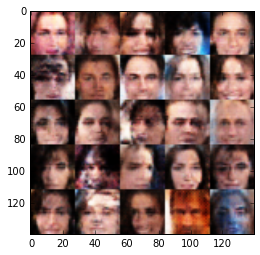

Epoch 4/10... Discriminator Loss: 1.2342... Generator Loss: 0.8305
Epoch 4/10... Discriminator Loss: 1.1074... Generator Loss: 0.7562
Epoch 4/10... Discriminator Loss: 1.1409... Generator Loss: 0.7887
Epoch 4/10... Discriminator Loss: 1.1852... Generator Loss: 0.8297
Epoch 4/10... Discriminator Loss: 1.7044... Generator Loss: 0.3040
Epoch 4/10... Discriminator Loss: 1.3376... Generator Loss: 1.3002
Epoch 4/10... Discriminator Loss: 1.2711... Generator Loss: 1.2129
Epoch 4/10... Discriminator Loss: 1.1299... Generator Loss: 0.8883
Epoch 4/10... Discriminator Loss: 1.0612... Generator Loss: 1.1909
Epoch 4/10... Discriminator Loss: 1.2435... Generator Loss: 0.7051


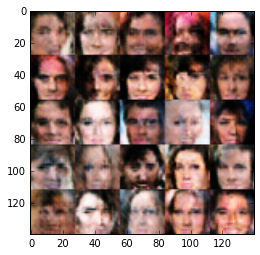

Epoch 4/10... Discriminator Loss: 1.3604... Generator Loss: 1.8632
Epoch 4/10... Discriminator Loss: 1.0963... Generator Loss: 0.7280
Epoch 4/10... Discriminator Loss: 1.3202... Generator Loss: 1.5486
Epoch 4/10... Discriminator Loss: 1.2878... Generator Loss: 0.8810
Epoch 4/10... Discriminator Loss: 1.1183... Generator Loss: 0.8008
Epoch 4/10... Discriminator Loss: 1.0495... Generator Loss: 0.9022
Epoch 4/10... Discriminator Loss: 1.1587... Generator Loss: 0.6199
Epoch 4/10... Discriminator Loss: 1.1770... Generator Loss: 0.7160
Epoch 4/10... Discriminator Loss: 1.2548... Generator Loss: 1.0629
Epoch 4/10... Discriminator Loss: 1.0839... Generator Loss: 0.7561


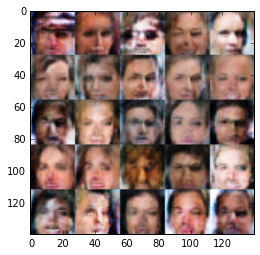

Epoch 4/10... Discriminator Loss: 2.2297... Generator Loss: 3.0017
Epoch 4/10... Discriminator Loss: 1.4302... Generator Loss: 0.9473
Epoch 4/10... Discriminator Loss: 1.1247... Generator Loss: 0.6957
Epoch 4/10... Discriminator Loss: 1.1284... Generator Loss: 0.7749
Epoch 4/10... Discriminator Loss: 1.2893... Generator Loss: 0.7193
Epoch 4/10... Discriminator Loss: 1.3608... Generator Loss: 1.4436
Epoch 4/10... Discriminator Loss: 1.1250... Generator Loss: 0.9205
Epoch 4/10... Discriminator Loss: 1.4374... Generator Loss: 1.6316
Epoch 4/10... Discriminator Loss: 1.3156... Generator Loss: 1.5415
Epoch 4/10... Discriminator Loss: 1.1085... Generator Loss: 1.0985


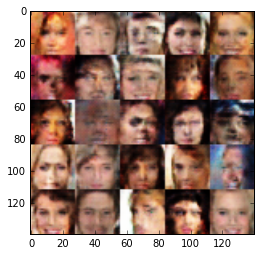

Epoch 4/10... Discriminator Loss: 1.1632... Generator Loss: 0.7206
Epoch 4/10... Discriminator Loss: 1.3498... Generator Loss: 0.4423
Epoch 4/10... Discriminator Loss: 1.0730... Generator Loss: 1.1586
Epoch 4/10... Discriminator Loss: 1.3643... Generator Loss: 0.6993
Epoch 4/10... Discriminator Loss: 1.1255... Generator Loss: 1.0284
Epoch 4/10... Discriminator Loss: 1.3513... Generator Loss: 0.5346
Epoch 4/10... Discriminator Loss: 1.2995... Generator Loss: 0.8906
Epoch 4/10... Discriminator Loss: 1.2809... Generator Loss: 0.5877
Epoch 4/10... Discriminator Loss: 1.3143... Generator Loss: 1.3889
Epoch 4/10... Discriminator Loss: 1.2785... Generator Loss: 0.6437


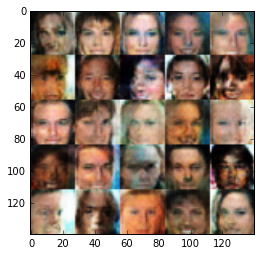

Epoch 4/10... Discriminator Loss: 1.1724... Generator Loss: 1.0654
Epoch 4/10... Discriminator Loss: 1.1476... Generator Loss: 0.7005
Epoch 4/10... Discriminator Loss: 1.0692... Generator Loss: 1.1964
Epoch 4/10... Discriminator Loss: 1.4327... Generator Loss: 1.4475
Epoch 4/10... Discriminator Loss: 1.2429... Generator Loss: 1.6213
Epoch 4/10... Discriminator Loss: 1.2514... Generator Loss: 1.2095
Epoch 4/10... Discriminator Loss: 1.0795... Generator Loss: 0.9558
Epoch 4/10... Discriminator Loss: 1.4776... Generator Loss: 0.4387
Epoch 4/10... Discriminator Loss: 1.1247... Generator Loss: 0.9538
Epoch 4/10... Discriminator Loss: 1.5460... Generator Loss: 0.3698


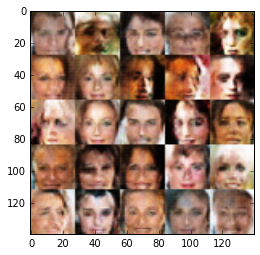

Epoch 4/10... Discriminator Loss: 1.1613... Generator Loss: 0.8791
Epoch 4/10... Discriminator Loss: 1.1698... Generator Loss: 1.2821
Epoch 4/10... Discriminator Loss: 1.5821... Generator Loss: 1.9264
Epoch 4/10... Discriminator Loss: 1.0744... Generator Loss: 1.3479
Epoch 4/10... Discriminator Loss: 1.1632... Generator Loss: 0.9710
Epoch 4/10... Discriminator Loss: 1.2817... Generator Loss: 1.4497
Epoch 4/10... Discriminator Loss: 1.1464... Generator Loss: 0.8940
Epoch 4/10... Discriminator Loss: 1.1398... Generator Loss: 1.0197
Epoch 4/10... Discriminator Loss: 1.2981... Generator Loss: 0.8961
Epoch 4/10... Discriminator Loss: 1.7173... Generator Loss: 1.9346


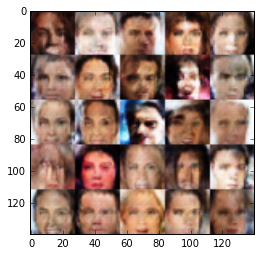

Epoch 4/10... Discriminator Loss: 1.2229... Generator Loss: 0.5901
Epoch 4/10... Discriminator Loss: 1.4918... Generator Loss: 1.3911
Epoch 4/10... Discriminator Loss: 1.4167... Generator Loss: 1.0822
Epoch 4/10... Discriminator Loss: 1.3503... Generator Loss: 1.2994
Epoch 4/10... Discriminator Loss: 1.0899... Generator Loss: 0.7240
Epoch 4/10... Discriminator Loss: 1.2068... Generator Loss: 0.7596
Epoch 5/10... Discriminator Loss: 1.1766... Generator Loss: 0.7808
Epoch 5/10... Discriminator Loss: 1.2271... Generator Loss: 0.6291
Epoch 5/10... Discriminator Loss: 1.2275... Generator Loss: 1.3087
Epoch 5/10... Discriminator Loss: 1.2439... Generator Loss: 0.9088


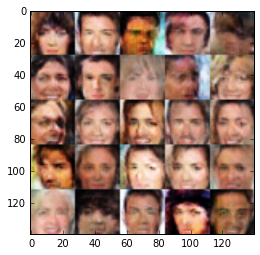

Epoch 5/10... Discriminator Loss: 1.2641... Generator Loss: 1.6543
Epoch 5/10... Discriminator Loss: 1.2603... Generator Loss: 0.7771
Epoch 5/10... Discriminator Loss: 1.2601... Generator Loss: 0.7168
Epoch 5/10... Discriminator Loss: 1.2629... Generator Loss: 1.5187
Epoch 5/10... Discriminator Loss: 1.2069... Generator Loss: 0.6685
Epoch 5/10... Discriminator Loss: 1.1186... Generator Loss: 1.1544
Epoch 5/10... Discriminator Loss: 1.4551... Generator Loss: 1.5834
Epoch 5/10... Discriminator Loss: 1.2077... Generator Loss: 0.7233
Epoch 5/10... Discriminator Loss: 1.1216... Generator Loss: 0.8610
Epoch 5/10... Discriminator Loss: 1.2948... Generator Loss: 1.5699


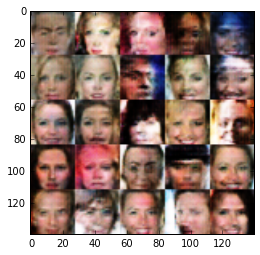

Epoch 5/10... Discriminator Loss: 1.1762... Generator Loss: 0.6475
Epoch 5/10... Discriminator Loss: 1.1478... Generator Loss: 0.7869
Epoch 5/10... Discriminator Loss: 1.1051... Generator Loss: 0.7728
Epoch 5/10... Discriminator Loss: 1.1824... Generator Loss: 0.8555
Epoch 5/10... Discriminator Loss: 1.4023... Generator Loss: 0.4523
Epoch 5/10... Discriminator Loss: 1.2866... Generator Loss: 1.0150
Epoch 5/10... Discriminator Loss: 1.4359... Generator Loss: 0.5030
Epoch 5/10... Discriminator Loss: 1.3219... Generator Loss: 0.5907
Epoch 5/10... Discriminator Loss: 1.3522... Generator Loss: 0.8669
Epoch 5/10... Discriminator Loss: 1.3029... Generator Loss: 0.5469


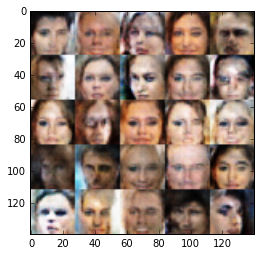

Epoch 5/10... Discriminator Loss: 1.4664... Generator Loss: 2.1071
Epoch 5/10... Discriminator Loss: 1.0566... Generator Loss: 0.9094
Epoch 5/10... Discriminator Loss: 1.1550... Generator Loss: 0.9457
Epoch 5/10... Discriminator Loss: 1.1914... Generator Loss: 0.6876
Epoch 5/10... Discriminator Loss: 1.1364... Generator Loss: 0.8486
Epoch 5/10... Discriminator Loss: 1.1400... Generator Loss: 0.8989
Epoch 5/10... Discriminator Loss: 1.2350... Generator Loss: 1.2135
Epoch 5/10... Discriminator Loss: 1.2132... Generator Loss: 0.9714
Epoch 5/10... Discriminator Loss: 1.2023... Generator Loss: 0.8182
Epoch 5/10... Discriminator Loss: 1.5654... Generator Loss: 0.3422


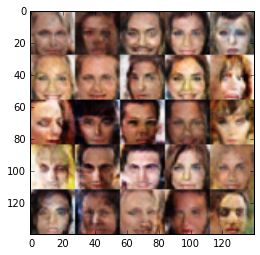

Epoch 5/10... Discriminator Loss: 1.2684... Generator Loss: 1.1171
Epoch 5/10... Discriminator Loss: 1.0847... Generator Loss: 0.9024
Epoch 5/10... Discriminator Loss: 1.2260... Generator Loss: 0.6064
Epoch 5/10... Discriminator Loss: 1.1750... Generator Loss: 0.7711
Epoch 5/10... Discriminator Loss: 1.2276... Generator Loss: 1.1814
Epoch 5/10... Discriminator Loss: 1.1914... Generator Loss: 0.6437
Epoch 5/10... Discriminator Loss: 1.2482... Generator Loss: 1.1609
Epoch 5/10... Discriminator Loss: 1.2488... Generator Loss: 0.6153
Epoch 5/10... Discriminator Loss: 1.3620... Generator Loss: 1.7339
Epoch 5/10... Discriminator Loss: 1.2085... Generator Loss: 0.7208


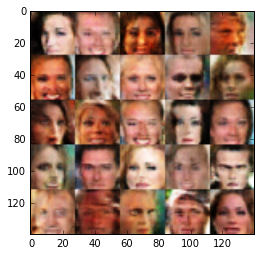

Epoch 5/10... Discriminator Loss: 1.2292... Generator Loss: 0.7230
Epoch 5/10... Discriminator Loss: 1.3052... Generator Loss: 1.1552
Epoch 5/10... Discriminator Loss: 1.1734... Generator Loss: 1.0758
Epoch 5/10... Discriminator Loss: 1.2161... Generator Loss: 0.6316
Epoch 5/10... Discriminator Loss: 1.1721... Generator Loss: 1.3201
Epoch 5/10... Discriminator Loss: 1.1015... Generator Loss: 1.0567
Epoch 5/10... Discriminator Loss: 1.3937... Generator Loss: 1.4980
Epoch 5/10... Discriminator Loss: 1.0718... Generator Loss: 0.9671
Epoch 5/10... Discriminator Loss: 1.0981... Generator Loss: 0.8901
Epoch 5/10... Discriminator Loss: 1.0761... Generator Loss: 1.1537


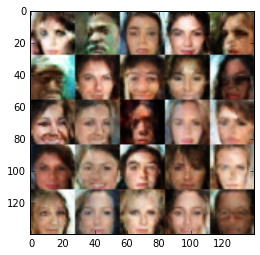

Epoch 5/10... Discriminator Loss: 1.6666... Generator Loss: 0.3260
Epoch 5/10... Discriminator Loss: 1.1523... Generator Loss: 0.8591
Epoch 5/10... Discriminator Loss: 1.2260... Generator Loss: 0.8849
Epoch 5/10... Discriminator Loss: 1.3830... Generator Loss: 0.4730
Epoch 5/10... Discriminator Loss: 1.1754... Generator Loss: 0.6487
Epoch 5/10... Discriminator Loss: 1.0984... Generator Loss: 0.9770
Epoch 5/10... Discriminator Loss: 1.1499... Generator Loss: 0.9255
Epoch 5/10... Discriminator Loss: 1.1439... Generator Loss: 0.8115
Epoch 5/10... Discriminator Loss: 1.1201... Generator Loss: 0.9319
Epoch 5/10... Discriminator Loss: 1.7947... Generator Loss: 0.2598


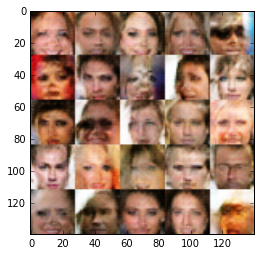

Epoch 5/10... Discriminator Loss: 1.2197... Generator Loss: 0.9338
Epoch 5/10... Discriminator Loss: 1.1081... Generator Loss: 0.9692
Epoch 5/10... Discriminator Loss: 1.6404... Generator Loss: 0.3413
Epoch 5/10... Discriminator Loss: 1.2148... Generator Loss: 0.8540
Epoch 5/10... Discriminator Loss: 1.2394... Generator Loss: 0.9481
Epoch 5/10... Discriminator Loss: 1.4442... Generator Loss: 0.4174
Epoch 5/10... Discriminator Loss: 1.1117... Generator Loss: 0.8970
Epoch 5/10... Discriminator Loss: 1.3068... Generator Loss: 0.5926
Epoch 5/10... Discriminator Loss: 1.1134... Generator Loss: 0.7739
Epoch 5/10... Discriminator Loss: 1.2200... Generator Loss: 1.0176


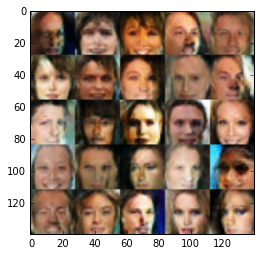

Epoch 5/10... Discriminator Loss: 1.2291... Generator Loss: 0.6032
Epoch 5/10... Discriminator Loss: 1.2381... Generator Loss: 1.1067
Epoch 5/10... Discriminator Loss: 1.1904... Generator Loss: 0.6163
Epoch 5/10... Discriminator Loss: 1.4085... Generator Loss: 0.4322
Epoch 5/10... Discriminator Loss: 1.2017... Generator Loss: 0.8887
Epoch 6/10... Discriminator Loss: 1.3010... Generator Loss: 0.6320
Epoch 6/10... Discriminator Loss: 1.0927... Generator Loss: 0.9686
Epoch 6/10... Discriminator Loss: 1.1312... Generator Loss: 0.9421
Epoch 6/10... Discriminator Loss: 1.1903... Generator Loss: 0.7993
Epoch 6/10... Discriminator Loss: 1.4165... Generator Loss: 1.4953


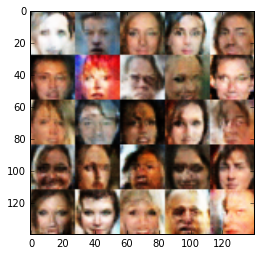

Epoch 6/10... Discriminator Loss: 1.2137... Generator Loss: 0.7032
Epoch 6/10... Discriminator Loss: 1.1110... Generator Loss: 0.8180
Epoch 6/10... Discriminator Loss: 1.4787... Generator Loss: 0.9242
Epoch 6/10... Discriminator Loss: 1.1031... Generator Loss: 0.9155
Epoch 6/10... Discriminator Loss: 1.2460... Generator Loss: 0.8309
Epoch 6/10... Discriminator Loss: 1.2062... Generator Loss: 0.6782
Epoch 6/10... Discriminator Loss: 1.3973... Generator Loss: 0.4468
Epoch 6/10... Discriminator Loss: 1.2415... Generator Loss: 0.9041
Epoch 6/10... Discriminator Loss: 1.1056... Generator Loss: 0.9344
Epoch 6/10... Discriminator Loss: 1.2964... Generator Loss: 0.8517


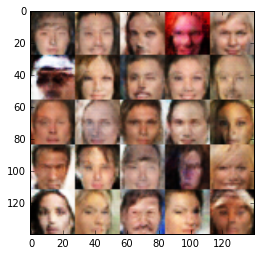

Epoch 6/10... Discriminator Loss: 1.2115... Generator Loss: 0.6538
Epoch 6/10... Discriminator Loss: 1.4244... Generator Loss: 0.9140
Epoch 6/10... Discriminator Loss: 1.2434... Generator Loss: 0.8241
Epoch 6/10... Discriminator Loss: 1.1177... Generator Loss: 0.8676
Epoch 6/10... Discriminator Loss: 1.3106... Generator Loss: 0.5573
Epoch 6/10... Discriminator Loss: 1.3747... Generator Loss: 1.5775
Epoch 6/10... Discriminator Loss: 1.2156... Generator Loss: 0.6843
Epoch 6/10... Discriminator Loss: 1.1308... Generator Loss: 0.8239
Epoch 6/10... Discriminator Loss: 1.1174... Generator Loss: 1.0256
Epoch 6/10... Discriminator Loss: 1.2354... Generator Loss: 0.6952


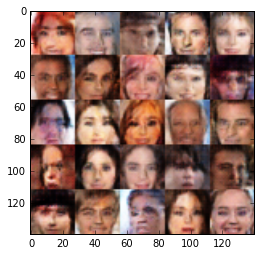

Epoch 6/10... Discriminator Loss: 1.3227... Generator Loss: 0.5364
Epoch 6/10... Discriminator Loss: 1.2742... Generator Loss: 0.5405
Epoch 6/10... Discriminator Loss: 1.0715... Generator Loss: 0.9552
Epoch 6/10... Discriminator Loss: 1.1830... Generator Loss: 1.0737
Epoch 6/10... Discriminator Loss: 1.2413... Generator Loss: 1.2801
Epoch 6/10... Discriminator Loss: 1.2448... Generator Loss: 0.7377
Epoch 6/10... Discriminator Loss: 1.1801... Generator Loss: 0.6631
Epoch 6/10... Discriminator Loss: 1.1924... Generator Loss: 0.9187
Epoch 6/10... Discriminator Loss: 1.2088... Generator Loss: 0.9543
Epoch 6/10... Discriminator Loss: 1.1826... Generator Loss: 0.6396


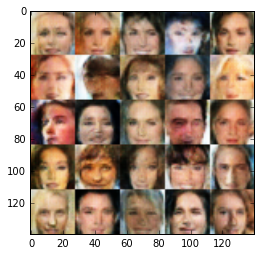

Epoch 6/10... Discriminator Loss: 1.2035... Generator Loss: 0.9988
Epoch 6/10... Discriminator Loss: 1.2032... Generator Loss: 0.5651
Epoch 6/10... Discriminator Loss: 1.2003... Generator Loss: 0.6656
Epoch 6/10... Discriminator Loss: 1.2121... Generator Loss: 0.8988
Epoch 6/10... Discriminator Loss: 1.0471... Generator Loss: 0.8962
Epoch 6/10... Discriminator Loss: 1.0890... Generator Loss: 1.0879
Epoch 6/10... Discriminator Loss: 1.3135... Generator Loss: 1.1730
Epoch 6/10... Discriminator Loss: 1.2677... Generator Loss: 0.5365
Epoch 6/10... Discriminator Loss: 1.1630... Generator Loss: 0.8351
Epoch 6/10... Discriminator Loss: 1.4353... Generator Loss: 1.7539


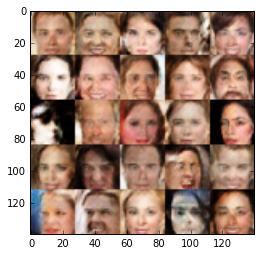

Epoch 6/10... Discriminator Loss: 1.2093... Generator Loss: 0.9851
Epoch 6/10... Discriminator Loss: 1.3412... Generator Loss: 0.5452
Epoch 6/10... Discriminator Loss: 1.1547... Generator Loss: 0.7839
Epoch 6/10... Discriminator Loss: 1.1996... Generator Loss: 0.5809
Epoch 6/10... Discriminator Loss: 1.3940... Generator Loss: 0.4845
Epoch 6/10... Discriminator Loss: 1.2343... Generator Loss: 0.7035
Epoch 6/10... Discriminator Loss: 1.2272... Generator Loss: 1.1966
Epoch 6/10... Discriminator Loss: 1.3243... Generator Loss: 0.5204
Epoch 6/10... Discriminator Loss: 1.3552... Generator Loss: 0.4982
Epoch 6/10... Discriminator Loss: 1.1776... Generator Loss: 0.9827


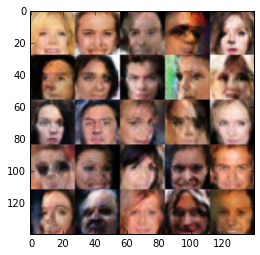

Epoch 6/10... Discriminator Loss: 1.0689... Generator Loss: 1.2173
Epoch 6/10... Discriminator Loss: 1.4610... Generator Loss: 1.5045
Epoch 6/10... Discriminator Loss: 1.1777... Generator Loss: 0.7306
Epoch 6/10... Discriminator Loss: 1.3287... Generator Loss: 0.6016
Epoch 6/10... Discriminator Loss: 1.2061... Generator Loss: 0.8748
Epoch 6/10... Discriminator Loss: 1.2831... Generator Loss: 1.1102
Epoch 6/10... Discriminator Loss: 1.2447... Generator Loss: 0.7720
Epoch 6/10... Discriminator Loss: 1.2606... Generator Loss: 0.6414
Epoch 6/10... Discriminator Loss: 1.6332... Generator Loss: 0.3228
Epoch 6/10... Discriminator Loss: 1.2087... Generator Loss: 0.9504


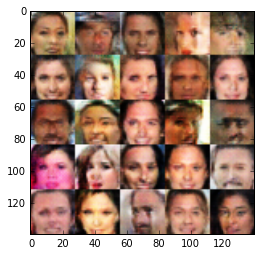

Epoch 6/10... Discriminator Loss: 1.1695... Generator Loss: 0.8535
Epoch 6/10... Discriminator Loss: 1.1989... Generator Loss: 1.4702
Epoch 6/10... Discriminator Loss: 1.1902... Generator Loss: 1.1549
Epoch 6/10... Discriminator Loss: 1.3778... Generator Loss: 0.5330
Epoch 6/10... Discriminator Loss: 1.1377... Generator Loss: 0.9011
Epoch 6/10... Discriminator Loss: 1.2600... Generator Loss: 0.9915
Epoch 6/10... Discriminator Loss: 1.1959... Generator Loss: 0.8643
Epoch 6/10... Discriminator Loss: 1.2159... Generator Loss: 0.6056
Epoch 6/10... Discriminator Loss: 1.7666... Generator Loss: 0.2527
Epoch 6/10... Discriminator Loss: 1.1622... Generator Loss: 0.8329


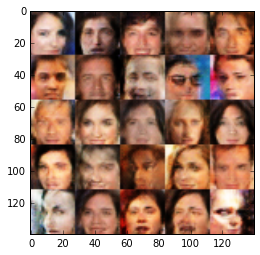

Epoch 6/10... Discriminator Loss: 1.2206... Generator Loss: 0.6604
Epoch 6/10... Discriminator Loss: 1.2616... Generator Loss: 0.9516
Epoch 6/10... Discriminator Loss: 1.0946... Generator Loss: 0.8052
Epoch 6/10... Discriminator Loss: 1.1304... Generator Loss: 0.9222
Epoch 7/10... Discriminator Loss: 1.0660... Generator Loss: 1.1202
Epoch 7/10... Discriminator Loss: 1.2847... Generator Loss: 1.3688
Epoch 7/10... Discriminator Loss: 1.1383... Generator Loss: 0.8690
Epoch 7/10... Discriminator Loss: 1.2902... Generator Loss: 0.6930
Epoch 7/10... Discriminator Loss: 1.5389... Generator Loss: 0.4119
Epoch 7/10... Discriminator Loss: 1.2234... Generator Loss: 1.0904


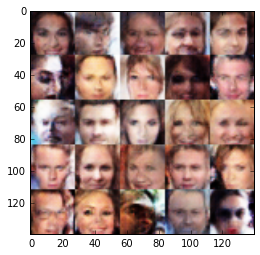

Epoch 7/10... Discriminator Loss: 1.5256... Generator Loss: 1.9566
Epoch 7/10... Discriminator Loss: 1.2044... Generator Loss: 0.8432
Epoch 7/10... Discriminator Loss: 1.1571... Generator Loss: 0.7336
Epoch 7/10... Discriminator Loss: 1.3988... Generator Loss: 1.2600
Epoch 7/10... Discriminator Loss: 1.3510... Generator Loss: 0.4544
Epoch 7/10... Discriminator Loss: 1.3424... Generator Loss: 1.0713
Epoch 7/10... Discriminator Loss: 1.1318... Generator Loss: 0.8434
Epoch 7/10... Discriminator Loss: 1.4122... Generator Loss: 0.4161
Epoch 7/10... Discriminator Loss: 1.2919... Generator Loss: 0.5118
Epoch 7/10... Discriminator Loss: 1.3056... Generator Loss: 1.0733


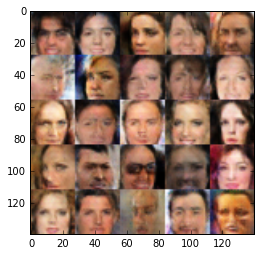

Epoch 7/10... Discriminator Loss: 1.3419... Generator Loss: 0.5255
Epoch 7/10... Discriminator Loss: 1.1886... Generator Loss: 1.3172
Epoch 7/10... Discriminator Loss: 1.1325... Generator Loss: 1.0309
Epoch 7/10... Discriminator Loss: 1.2080... Generator Loss: 1.1574
Epoch 7/10... Discriminator Loss: 1.3250... Generator Loss: 0.4819
Epoch 7/10... Discriminator Loss: 1.2699... Generator Loss: 0.8551
Epoch 7/10... Discriminator Loss: 1.4036... Generator Loss: 0.4250
Epoch 7/10... Discriminator Loss: 1.3834... Generator Loss: 1.5072
Epoch 7/10... Discriminator Loss: 1.1860... Generator Loss: 0.6738
Epoch 7/10... Discriminator Loss: 1.3748... Generator Loss: 1.4300


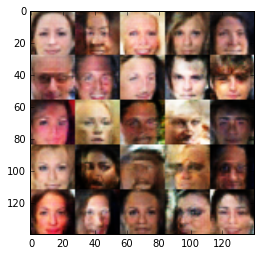

Epoch 7/10... Discriminator Loss: 1.3119... Generator Loss: 0.6473
Epoch 7/10... Discriminator Loss: 1.3041... Generator Loss: 0.6234
Epoch 7/10... Discriminator Loss: 1.2120... Generator Loss: 0.6744
Epoch 7/10... Discriminator Loss: 1.2120... Generator Loss: 0.7064
Epoch 7/10... Discriminator Loss: 1.2539... Generator Loss: 0.6005
Epoch 7/10... Discriminator Loss: 1.1731... Generator Loss: 0.9884
Epoch 7/10... Discriminator Loss: 1.0798... Generator Loss: 0.8877
Epoch 7/10... Discriminator Loss: 1.1712... Generator Loss: 1.0639
Epoch 7/10... Discriminator Loss: 1.1530... Generator Loss: 0.7160
Epoch 7/10... Discriminator Loss: 1.1865... Generator Loss: 0.8309


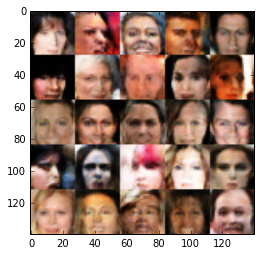

Epoch 7/10... Discriminator Loss: 1.1049... Generator Loss: 0.8451
Epoch 7/10... Discriminator Loss: 1.2911... Generator Loss: 1.1197
Epoch 7/10... Discriminator Loss: 1.0536... Generator Loss: 0.7895
Epoch 7/10... Discriminator Loss: 1.2212... Generator Loss: 1.0493
Epoch 7/10... Discriminator Loss: 1.2214... Generator Loss: 0.7359
Epoch 7/10... Discriminator Loss: 1.3719... Generator Loss: 1.8681
Epoch 7/10... Discriminator Loss: 1.5121... Generator Loss: 0.3539
Epoch 7/10... Discriminator Loss: 1.1927... Generator Loss: 0.8511
Epoch 7/10... Discriminator Loss: 1.5601... Generator Loss: 1.8693
Epoch 7/10... Discriminator Loss: 1.2060... Generator Loss: 1.0070


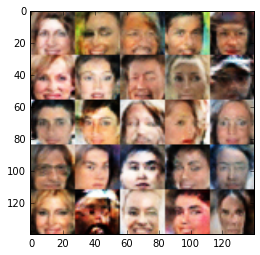

Epoch 7/10... Discriminator Loss: 1.7688... Generator Loss: 0.2666
Epoch 7/10... Discriminator Loss: 1.2611... Generator Loss: 0.8920
Epoch 7/10... Discriminator Loss: 1.1544... Generator Loss: 1.3089
Epoch 7/10... Discriminator Loss: 1.1700... Generator Loss: 1.2486
Epoch 7/10... Discriminator Loss: 1.1002... Generator Loss: 1.1732
Epoch 7/10... Discriminator Loss: 1.2238... Generator Loss: 0.8722
Epoch 7/10... Discriminator Loss: 1.0704... Generator Loss: 1.2158
Epoch 7/10... Discriminator Loss: 1.2698... Generator Loss: 0.7351
Epoch 7/10... Discriminator Loss: 1.1496... Generator Loss: 0.7215
Epoch 7/10... Discriminator Loss: 1.3248... Generator Loss: 0.5025


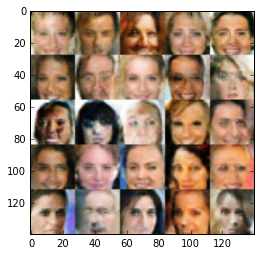

Epoch 7/10... Discriminator Loss: 1.1776... Generator Loss: 0.9406
Epoch 7/10... Discriminator Loss: 1.3068... Generator Loss: 0.6386
Epoch 7/10... Discriminator Loss: 1.2041... Generator Loss: 0.7092
Epoch 7/10... Discriminator Loss: 2.0476... Generator Loss: 2.4761
Epoch 7/10... Discriminator Loss: 1.1890... Generator Loss: 0.9278
Epoch 7/10... Discriminator Loss: 1.3392... Generator Loss: 1.0618
Epoch 7/10... Discriminator Loss: 1.0908... Generator Loss: 0.8711
Epoch 7/10... Discriminator Loss: 2.9206... Generator Loss: 3.6885
Epoch 7/10... Discriminator Loss: 1.3716... Generator Loss: 0.7332
Epoch 7/10... Discriminator Loss: 1.2067... Generator Loss: 0.7977


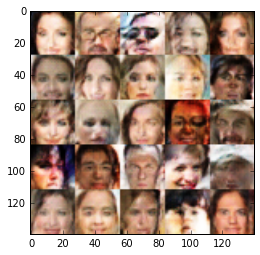

Epoch 7/10... Discriminator Loss: 2.3603... Generator Loss: 0.1440
Epoch 7/10... Discriminator Loss: 1.2531... Generator Loss: 0.7699
Epoch 7/10... Discriminator Loss: 1.1696... Generator Loss: 0.6848
Epoch 7/10... Discriminator Loss: 1.2578... Generator Loss: 0.5884
Epoch 7/10... Discriminator Loss: 1.2273... Generator Loss: 0.8182
Epoch 7/10... Discriminator Loss: 1.3506... Generator Loss: 1.1278
Epoch 7/10... Discriminator Loss: 1.3002... Generator Loss: 1.4277
Epoch 7/10... Discriminator Loss: 1.1133... Generator Loss: 1.0754
Epoch 7/10... Discriminator Loss: 1.1526... Generator Loss: 0.7157
Epoch 7/10... Discriminator Loss: 1.1902... Generator Loss: 0.7733


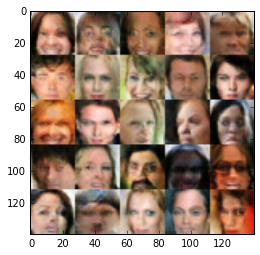

Epoch 7/10... Discriminator Loss: 1.2618... Generator Loss: 1.0090
Epoch 7/10... Discriminator Loss: 1.4935... Generator Loss: 0.3869
Epoch 7/10... Discriminator Loss: 1.1733... Generator Loss: 0.9970
Epoch 8/10... Discriminator Loss: 1.1679... Generator Loss: 0.8139
Epoch 8/10... Discriminator Loss: 1.0437... Generator Loss: 0.9162
Epoch 8/10... Discriminator Loss: 1.0707... Generator Loss: 0.7907
Epoch 8/10... Discriminator Loss: 1.1907... Generator Loss: 0.7466
Epoch 8/10... Discriminator Loss: 1.4036... Generator Loss: 0.4427
Epoch 8/10... Discriminator Loss: 1.2859... Generator Loss: 1.3771
Epoch 8/10... Discriminator Loss: 1.5268... Generator Loss: 0.3565


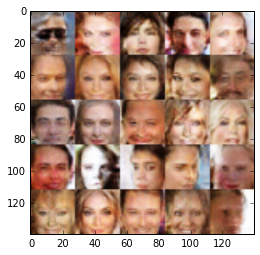

Epoch 8/10... Discriminator Loss: 1.3738... Generator Loss: 0.8517
Epoch 8/10... Discriminator Loss: 1.2383... Generator Loss: 0.9698
Epoch 8/10... Discriminator Loss: 1.1296... Generator Loss: 0.8289
Epoch 8/10... Discriminator Loss: 1.1677... Generator Loss: 0.8073
Epoch 8/10... Discriminator Loss: 1.3249... Generator Loss: 0.5165
Epoch 8/10... Discriminator Loss: 2.3826... Generator Loss: 0.1239
Epoch 8/10... Discriminator Loss: 1.3836... Generator Loss: 0.5375
Epoch 8/10... Discriminator Loss: 1.1992... Generator Loss: 0.8320
Epoch 8/10... Discriminator Loss: 1.3573... Generator Loss: 0.5230
Epoch 8/10... Discriminator Loss: 1.0654... Generator Loss: 0.9844


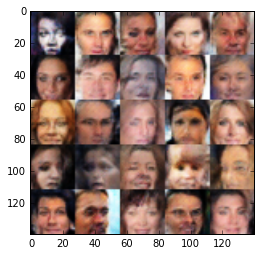

Epoch 8/10... Discriminator Loss: 1.3001... Generator Loss: 0.5888
Epoch 8/10... Discriminator Loss: 1.1476... Generator Loss: 0.7657
Epoch 8/10... Discriminator Loss: 1.1310... Generator Loss: 1.0036
Epoch 8/10... Discriminator Loss: 1.2305... Generator Loss: 0.6064
Epoch 8/10... Discriminator Loss: 1.2573... Generator Loss: 1.0952
Epoch 8/10... Discriminator Loss: 1.1110... Generator Loss: 0.9208
Epoch 8/10... Discriminator Loss: 1.0341... Generator Loss: 1.0262
Epoch 8/10... Discriminator Loss: 1.0710... Generator Loss: 0.9084
Epoch 8/10... Discriminator Loss: 1.6686... Generator Loss: 2.2258
Epoch 8/10... Discriminator Loss: 1.2370... Generator Loss: 0.5273


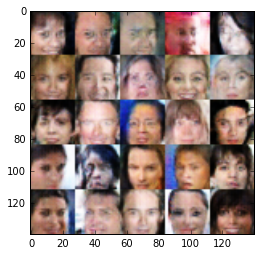

Epoch 8/10... Discriminator Loss: 1.2629... Generator Loss: 0.8768
Epoch 8/10... Discriminator Loss: 1.2422... Generator Loss: 0.7616
Epoch 8/10... Discriminator Loss: 1.1029... Generator Loss: 0.9616
Epoch 8/10... Discriminator Loss: 1.1170... Generator Loss: 1.2374
Epoch 8/10... Discriminator Loss: 1.2273... Generator Loss: 0.9380
Epoch 8/10... Discriminator Loss: 1.5285... Generator Loss: 0.3356
Epoch 8/10... Discriminator Loss: 1.3250... Generator Loss: 0.5731
Epoch 8/10... Discriminator Loss: 1.2210... Generator Loss: 0.6345
Epoch 8/10... Discriminator Loss: 1.2816... Generator Loss: 1.4411
Epoch 8/10... Discriminator Loss: 1.1585... Generator Loss: 0.9603


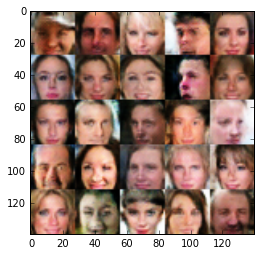

Epoch 8/10... Discriminator Loss: 1.4088... Generator Loss: 0.4577
Epoch 8/10... Discriminator Loss: 1.1452... Generator Loss: 1.1870
Epoch 8/10... Discriminator Loss: 1.2613... Generator Loss: 0.4858
Epoch 8/10... Discriminator Loss: 1.4020... Generator Loss: 0.4975
Epoch 8/10... Discriminator Loss: 1.2030... Generator Loss: 1.2777
Epoch 8/10... Discriminator Loss: 1.7291... Generator Loss: 0.2657
Epoch 8/10... Discriminator Loss: 1.0963... Generator Loss: 1.1336
Epoch 8/10... Discriminator Loss: 1.3604... Generator Loss: 0.4736
Epoch 8/10... Discriminator Loss: 1.6967... Generator Loss: 0.2867
Epoch 8/10... Discriminator Loss: 1.1618... Generator Loss: 0.6948


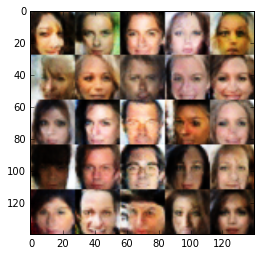

Epoch 8/10... Discriminator Loss: 1.3710... Generator Loss: 0.4361
Epoch 8/10... Discriminator Loss: 1.1471... Generator Loss: 0.9702
Epoch 8/10... Discriminator Loss: 1.2633... Generator Loss: 0.7245
Epoch 8/10... Discriminator Loss: 1.4673... Generator Loss: 1.4094
Epoch 8/10... Discriminator Loss: 1.3934... Generator Loss: 1.3908
Epoch 8/10... Discriminator Loss: 1.2034... Generator Loss: 0.9638
Epoch 8/10... Discriminator Loss: 1.5215... Generator Loss: 0.3751
Epoch 8/10... Discriminator Loss: 1.2150... Generator Loss: 1.1034
Epoch 8/10... Discriminator Loss: 1.1301... Generator Loss: 0.7453
Epoch 8/10... Discriminator Loss: 1.0605... Generator Loss: 1.1563


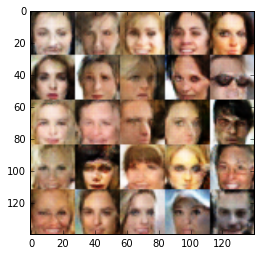

Epoch 8/10... Discriminator Loss: 1.1435... Generator Loss: 1.1353
Epoch 8/10... Discriminator Loss: 1.2289... Generator Loss: 0.5757
Epoch 8/10... Discriminator Loss: 1.1987... Generator Loss: 0.8522
Epoch 8/10... Discriminator Loss: 1.3433... Generator Loss: 0.4863
Epoch 8/10... Discriminator Loss: 1.6308... Generator Loss: 1.9884
Epoch 8/10... Discriminator Loss: 1.4466... Generator Loss: 0.5583
Epoch 8/10... Discriminator Loss: 1.6055... Generator Loss: 0.3421
Epoch 8/10... Discriminator Loss: 1.0822... Generator Loss: 1.0280
Epoch 8/10... Discriminator Loss: 1.1087... Generator Loss: 1.0453
Epoch 8/10... Discriminator Loss: 1.3155... Generator Loss: 0.5696


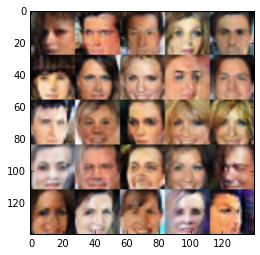

Epoch 8/10... Discriminator Loss: 1.3481... Generator Loss: 0.5176
Epoch 8/10... Discriminator Loss: 1.7899... Generator Loss: 2.5008
Epoch 8/10... Discriminator Loss: 1.2472... Generator Loss: 1.1779
Epoch 8/10... Discriminator Loss: 1.2466... Generator Loss: 1.2628
Epoch 8/10... Discriminator Loss: 1.2146... Generator Loss: 1.0283
Epoch 8/10... Discriminator Loss: 1.2057... Generator Loss: 0.5980
Epoch 8/10... Discriminator Loss: 1.7271... Generator Loss: 0.2876
Epoch 8/10... Discriminator Loss: 1.1114... Generator Loss: 0.9629
Epoch 8/10... Discriminator Loss: 1.6869... Generator Loss: 0.3150
Epoch 8/10... Discriminator Loss: 1.1527... Generator Loss: 0.8717


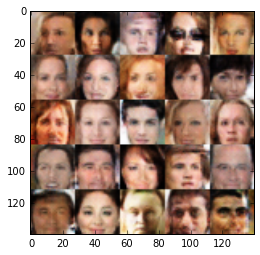

Epoch 8/10... Discriminator Loss: 1.1694... Generator Loss: 1.1021
Epoch 8/10... Discriminator Loss: 1.1201... Generator Loss: 0.9260
Epoch 9/10... Discriminator Loss: 1.2829... Generator Loss: 0.6051
Epoch 9/10... Discriminator Loss: 1.3255... Generator Loss: 0.6177
Epoch 9/10... Discriminator Loss: 1.2361... Generator Loss: 0.5416
Epoch 9/10... Discriminator Loss: 1.1111... Generator Loss: 0.8386
Epoch 9/10... Discriminator Loss: 1.4943... Generator Loss: 0.3836
Epoch 9/10... Discriminator Loss: 1.0866... Generator Loss: 0.9028
Epoch 9/10... Discriminator Loss: 1.1217... Generator Loss: 0.8161
Epoch 9/10... Discriminator Loss: 1.2663... Generator Loss: 0.6694


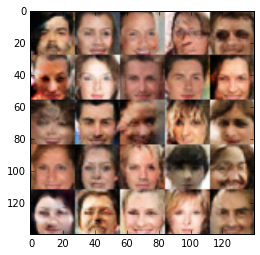

Epoch 9/10... Discriminator Loss: 1.6588... Generator Loss: 1.5988
Epoch 9/10... Discriminator Loss: 1.3864... Generator Loss: 0.4511
Epoch 9/10... Discriminator Loss: 1.4449... Generator Loss: 0.4008
Epoch 9/10... Discriminator Loss: 1.2551... Generator Loss: 0.6699
Epoch 9/10... Discriminator Loss: 1.4376... Generator Loss: 1.3331
Epoch 9/10... Discriminator Loss: 1.0392... Generator Loss: 0.9211
Epoch 9/10... Discriminator Loss: 1.2309... Generator Loss: 0.6005
Epoch 9/10... Discriminator Loss: 1.2924... Generator Loss: 1.9087
Epoch 9/10... Discriminator Loss: 1.1301... Generator Loss: 0.7195
Epoch 9/10... Discriminator Loss: 1.3864... Generator Loss: 0.4831


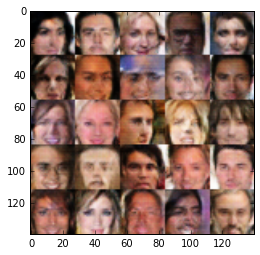

Epoch 9/10... Discriminator Loss: 1.2871... Generator Loss: 0.7354
Epoch 9/10... Discriminator Loss: 1.4447... Generator Loss: 1.3706
Epoch 9/10... Discriminator Loss: 1.2518... Generator Loss: 1.3230
Epoch 9/10... Discriminator Loss: 1.1218... Generator Loss: 0.7412
Epoch 9/10... Discriminator Loss: 1.2409... Generator Loss: 0.5046
Epoch 9/10... Discriminator Loss: 1.1090... Generator Loss: 0.9614
Epoch 9/10... Discriminator Loss: 1.1806... Generator Loss: 1.1041
Epoch 9/10... Discriminator Loss: 1.3996... Generator Loss: 1.4931
Epoch 9/10... Discriminator Loss: 1.2503... Generator Loss: 0.5476
Epoch 9/10... Discriminator Loss: 1.2000... Generator Loss: 0.7061


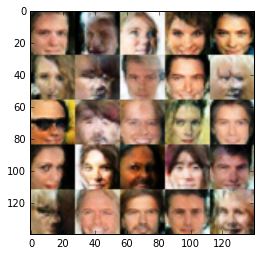

Epoch 9/10... Discriminator Loss: 1.3421... Generator Loss: 0.5415
Epoch 9/10... Discriminator Loss: 1.2818... Generator Loss: 0.5359
Epoch 9/10... Discriminator Loss: 1.1568... Generator Loss: 0.8821
Epoch 9/10... Discriminator Loss: 0.9457... Generator Loss: 1.0714
Epoch 9/10... Discriminator Loss: 1.1708... Generator Loss: 0.9011
Epoch 9/10... Discriminator Loss: 1.0881... Generator Loss: 0.9347
Epoch 9/10... Discriminator Loss: 1.2767... Generator Loss: 1.0161
Epoch 9/10... Discriminator Loss: 1.1870... Generator Loss: 0.6845
Epoch 9/10... Discriminator Loss: 1.4320... Generator Loss: 0.4416
Epoch 9/10... Discriminator Loss: 1.2701... Generator Loss: 0.6028


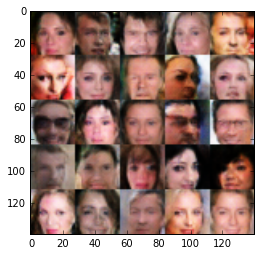

Epoch 9/10... Discriminator Loss: 1.1884... Generator Loss: 0.7519
Epoch 9/10... Discriminator Loss: 1.1285... Generator Loss: 1.7316
Epoch 9/10... Discriminator Loss: 1.1542... Generator Loss: 0.9228
Epoch 9/10... Discriminator Loss: 1.3647... Generator Loss: 0.4634
Epoch 9/10... Discriminator Loss: 1.1211... Generator Loss: 1.6267
Epoch 9/10... Discriminator Loss: 1.3110... Generator Loss: 0.4864
Epoch 9/10... Discriminator Loss: 1.3090... Generator Loss: 0.8364
Epoch 9/10... Discriminator Loss: 1.1888... Generator Loss: 1.4537
Epoch 9/10... Discriminator Loss: 1.2184... Generator Loss: 0.6604
Epoch 9/10... Discriminator Loss: 1.2926... Generator Loss: 0.5061


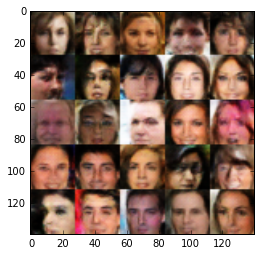

Epoch 9/10... Discriminator Loss: 1.3037... Generator Loss: 0.6683
Epoch 9/10... Discriminator Loss: 1.1286... Generator Loss: 0.6388
Epoch 9/10... Discriminator Loss: 1.1625... Generator Loss: 1.1534
Epoch 9/10... Discriminator Loss: 1.1515... Generator Loss: 1.2953
Epoch 9/10... Discriminator Loss: 1.0872... Generator Loss: 0.7767
Epoch 9/10... Discriminator Loss: 1.2760... Generator Loss: 0.8540
Epoch 9/10... Discriminator Loss: 1.1541... Generator Loss: 1.1512
Epoch 9/10... Discriminator Loss: 1.5553... Generator Loss: 0.3230
Epoch 9/10... Discriminator Loss: 1.4018... Generator Loss: 0.4507
Epoch 9/10... Discriminator Loss: 1.3545... Generator Loss: 0.4821


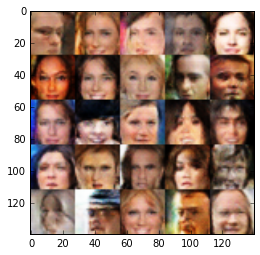

Epoch 9/10... Discriminator Loss: 1.1366... Generator Loss: 0.7442
Epoch 9/10... Discriminator Loss: 1.1344... Generator Loss: 1.0338
Epoch 9/10... Discriminator Loss: 1.1456... Generator Loss: 0.8944
Epoch 9/10... Discriminator Loss: 1.1222... Generator Loss: 0.7697
Epoch 9/10... Discriminator Loss: 1.0885... Generator Loss: 0.8524
Epoch 9/10... Discriminator Loss: 1.3979... Generator Loss: 1.6788
Epoch 9/10... Discriminator Loss: 1.1903... Generator Loss: 0.8335
Epoch 9/10... Discriminator Loss: 1.1272... Generator Loss: 0.8388
Epoch 9/10... Discriminator Loss: 1.2778... Generator Loss: 1.1742
Epoch 9/10... Discriminator Loss: 1.3533... Generator Loss: 0.5648


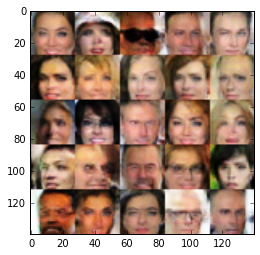

Epoch 9/10... Discriminator Loss: 1.2507... Generator Loss: 0.6844
Epoch 9/10... Discriminator Loss: 1.6157... Generator Loss: 0.3221
Epoch 9/10... Discriminator Loss: 1.1562... Generator Loss: 1.0435
Epoch 9/10... Discriminator Loss: 1.3210... Generator Loss: 0.8437
Epoch 9/10... Discriminator Loss: 1.1372... Generator Loss: 0.9926
Epoch 9/10... Discriminator Loss: 1.1168... Generator Loss: 0.7886
Epoch 9/10... Discriminator Loss: 1.1390... Generator Loss: 0.9093
Epoch 9/10... Discriminator Loss: 1.2874... Generator Loss: 1.1886
Epoch 9/10... Discriminator Loss: 1.2083... Generator Loss: 0.7981
Epoch 9/10... Discriminator Loss: 1.0380... Generator Loss: 0.8445


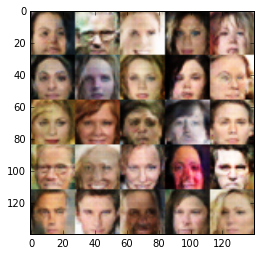

Epoch 9/10... Discriminator Loss: 1.2105... Generator Loss: 0.9670
Epoch 10/10... Discriminator Loss: 1.1934... Generator Loss: 0.7391
Epoch 10/10... Discriminator Loss: 1.2977... Generator Loss: 0.9202
Epoch 10/10... Discriminator Loss: 1.1319... Generator Loss: 1.3241
Epoch 10/10... Discriminator Loss: 1.7818... Generator Loss: 0.2557
Epoch 10/10... Discriminator Loss: 0.9952... Generator Loss: 1.0211
Epoch 10/10... Discriminator Loss: 1.1214... Generator Loss: 0.9028
Epoch 10/10... Discriminator Loss: 1.2572... Generator Loss: 1.2160
Epoch 10/10... Discriminator Loss: 1.6361... Generator Loss: 0.3202
Epoch 10/10... Discriminator Loss: 1.1521... Generator Loss: 1.0205


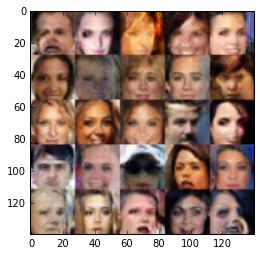

Epoch 10/10... Discriminator Loss: 1.3876... Generator Loss: 0.4864
Epoch 10/10... Discriminator Loss: 1.2629... Generator Loss: 1.2853
Epoch 10/10... Discriminator Loss: 1.2336... Generator Loss: 0.6923
Epoch 10/10... Discriminator Loss: 1.2743... Generator Loss: 0.6156
Epoch 10/10... Discriminator Loss: 1.2273... Generator Loss: 1.0202
Epoch 10/10... Discriminator Loss: 1.2915... Generator Loss: 1.3760
Epoch 10/10... Discriminator Loss: 1.2642... Generator Loss: 0.6801
Epoch 10/10... Discriminator Loss: 1.0919... Generator Loss: 1.2227
Epoch 10/10... Discriminator Loss: 1.2992... Generator Loss: 0.7985
Epoch 10/10... Discriminator Loss: 1.2678... Generator Loss: 1.0303


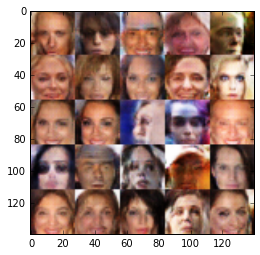

Epoch 10/10... Discriminator Loss: 2.0891... Generator Loss: 0.1964
Epoch 10/10... Discriminator Loss: 1.1815... Generator Loss: 0.7045
Epoch 10/10... Discriminator Loss: 1.2053... Generator Loss: 0.6405
Epoch 10/10... Discriminator Loss: 1.1164... Generator Loss: 0.9017
Epoch 10/10... Discriminator Loss: 1.5650... Generator Loss: 0.3533
Epoch 10/10... Discriminator Loss: 1.1813... Generator Loss: 0.6940
Epoch 10/10... Discriminator Loss: 1.2174... Generator Loss: 1.1343
Epoch 10/10... Discriminator Loss: 1.3436... Generator Loss: 1.0822
Epoch 10/10... Discriminator Loss: 1.1480... Generator Loss: 1.1736
Epoch 10/10... Discriminator Loss: 1.1393... Generator Loss: 1.0012


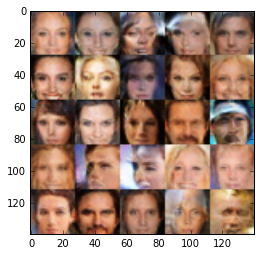

Epoch 10/10... Discriminator Loss: 1.5684... Generator Loss: 2.1424
Epoch 10/10... Discriminator Loss: 1.0141... Generator Loss: 0.9487
Epoch 10/10... Discriminator Loss: 1.0602... Generator Loss: 0.8445
Epoch 10/10... Discriminator Loss: 1.2322... Generator Loss: 1.2421
Epoch 10/10... Discriminator Loss: 1.4466... Generator Loss: 1.1348
Epoch 10/10... Discriminator Loss: 1.1124... Generator Loss: 1.8151
Epoch 10/10... Discriminator Loss: 0.9156... Generator Loss: 1.6893
Epoch 10/10... Discriminator Loss: 1.3897... Generator Loss: 0.5627
Epoch 10/10... Discriminator Loss: 1.7274... Generator Loss: 0.2899
Epoch 10/10... Discriminator Loss: 1.1309... Generator Loss: 0.7498


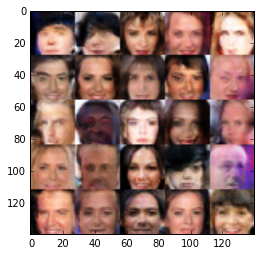

Epoch 10/10... Discriminator Loss: 1.0423... Generator Loss: 0.9761
Epoch 10/10... Discriminator Loss: 1.1108... Generator Loss: 0.7902
Epoch 10/10... Discriminator Loss: 1.2061... Generator Loss: 0.7151
Epoch 10/10... Discriminator Loss: 1.0272... Generator Loss: 0.8097
Epoch 10/10... Discriminator Loss: 1.2802... Generator Loss: 1.0819
Epoch 10/10... Discriminator Loss: 1.1808... Generator Loss: 1.1871
Epoch 10/10... Discriminator Loss: 1.2874... Generator Loss: 1.4801
Epoch 10/10... Discriminator Loss: 1.0762... Generator Loss: 0.8531
Epoch 10/10... Discriminator Loss: 1.3269... Generator Loss: 0.4833
Epoch 10/10... Discriminator Loss: 1.2083... Generator Loss: 0.5807


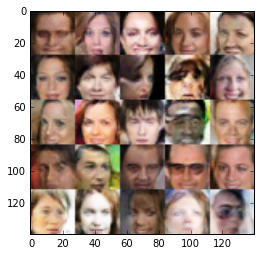

Epoch 10/10... Discriminator Loss: 1.1358... Generator Loss: 0.8326
Epoch 10/10... Discriminator Loss: 1.1447... Generator Loss: 0.6754
Epoch 10/10... Discriminator Loss: 1.3701... Generator Loss: 0.4426
Epoch 10/10... Discriminator Loss: 1.2332... Generator Loss: 0.9890
Epoch 10/10... Discriminator Loss: 1.3000... Generator Loss: 0.5933
Epoch 10/10... Discriminator Loss: 1.3510... Generator Loss: 0.4573
Epoch 10/10... Discriminator Loss: 1.1058... Generator Loss: 1.0691
Epoch 10/10... Discriminator Loss: 1.1724... Generator Loss: 1.0015
Epoch 10/10... Discriminator Loss: 1.3593... Generator Loss: 2.1254
Epoch 10/10... Discriminator Loss: 1.2168... Generator Loss: 0.6315


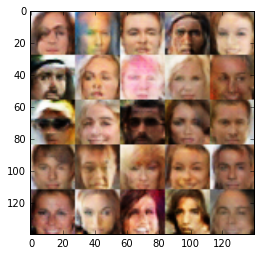

Epoch 10/10... Discriminator Loss: 1.1902... Generator Loss: 1.0903
Epoch 10/10... Discriminator Loss: 1.3848... Generator Loss: 0.4815
Epoch 10/10... Discriminator Loss: 1.1111... Generator Loss: 0.8978
Epoch 10/10... Discriminator Loss: 1.3839... Generator Loss: 0.4877
Epoch 10/10... Discriminator Loss: 1.3547... Generator Loss: 0.4745
Epoch 10/10... Discriminator Loss: 1.2727... Generator Loss: 1.2516
Epoch 10/10... Discriminator Loss: 1.2868... Generator Loss: 0.6627
Epoch 10/10... Discriminator Loss: 1.4231... Generator Loss: 0.4137
Epoch 10/10... Discriminator Loss: 1.2501... Generator Loss: 0.6849
Epoch 10/10... Discriminator Loss: 1.7881... Generator Loss: 0.2532


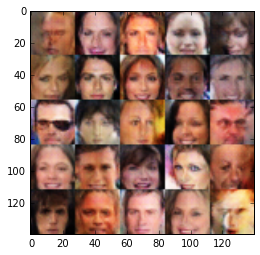

Epoch 10/10... Discriminator Loss: 1.0030... Generator Loss: 1.3310
Epoch 10/10... Discriminator Loss: 1.2351... Generator Loss: 0.7562
Epoch 10/10... Discriminator Loss: 1.2029... Generator Loss: 0.6915
Epoch 10/10... Discriminator Loss: 1.2858... Generator Loss: 0.5650
Epoch 10/10... Discriminator Loss: 1.2685... Generator Loss: 1.5464
Epoch 10/10... Discriminator Loss: 1.2048... Generator Loss: 1.2498
Epoch 10/10... Discriminator Loss: 1.3916... Generator Loss: 0.5043
Epoch 10/10... Discriminator Loss: 1.2213... Generator Loss: 1.0879
Epoch 10/10... Discriminator Loss: 1.2433... Generator Loss: 1.0830
Epoch 10/10... Discriminator Loss: 1.2521... Generator Loss: 0.7366


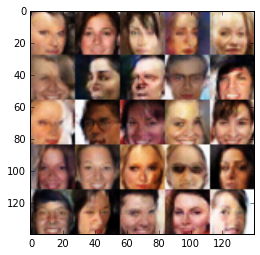

Epoch 10/10... Discriminator Loss: 1.1247... Generator Loss: 0.6848


In [82]:
batch_size = 256
z_dim = 150
learning_rate = 0.006
beta1 = 0.5


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 10

celeba_dataset = helper.Dataset('celeba', glob(os.path.join(data_dir, 'img_align_celeba/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, celeba_dataset.get_batches,
          celeba_dataset.shape, celeba_dataset.image_mode)

### Submitting This Project
When submitting this project, make sure to run all the cells before saving the notebook. Save the notebook file as "dlnd_face_generation.ipynb" and save it as a HTML file under "File" -> "Download as". Include the "helper.py" and "problem_unittests.py" files in your submission.